In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import statsmodels.graphics.tsaplots as sgt
import statsmodels.tsa.stattools as sts
from statsmodels.tsa.arima_model import ARIMA
from scipy.stats.distributions import chi2 
from statsmodels.tsa.seasonal import seasonal_decompose
from math import sqrt
import seaborn as sns
sns.set()
from IPython.display import display, Math, Latex

In [ ]:
df = pd.read_csv('/content/META (1).csv')

Datos

In [ ]:
df.head()


,Date,Open,High,Low,Close,Adj Close,Volume
0,2020-01-27,213.100006,216.059998,212.500000,214.869995,214.869995,13810700
1,2020-01-28,216.139999,218.740005,213.520004,217.789993,217.789993,13413800
2,2020-01-29,221.440002,224.199997,218.449997,223.229996,223.229996,33181300
3,2020-01-30,206.529999,211.429993,204.750000,209.529999,209.529999,48775500
4,2020-01-31,208.429993,208.690002,201.059998,201.910004,201.910004,31359900


In [ ]:
df.tail()

,Date,Open,High,Low,Close,Adj Close,Volume,trend,returns,sq_returns
726,2022-12-12,115.180000,115.720001,113.139999,114.709999,114.709999,24747100,118.082317,-1.026750,1.054215
727,2022-12-13,122.129997,123.300003,118.639999,120.150002,120.150002,44701100,118.577252,4.742397,22.490325
728,2022-12-14,119.389999,124.139999,119.389999,121.589996,121.589996,36922000,119.068353,1.198497,1.436395
729,2022-12-15,118.330002,118.629997,114.010002,116.150002,116.150002,34531000,119.556558,-4.474047,20.017100
730,2022-12-16,120.230003,123.309998,118.820000,119.430000,119.430000,67045000,120.044378,2.823933,7.974596


Estadistica Descriptiva

In [ ]:
df.describe()

,Open,High,Low,Close,Adj Close,Volume
count,731.000000,731.000000,731.000000,731.000000,731.000000,7.310000e+02
mean,247.502257,251.262517,243.889631,247.552121,247.552121,2.592165e+07
std,72.745981,72.997251,72.374940,72.747827,72.747827,1.747529e+07
min,90.080002,90.459999,88.089996,88.910004,88.910004,6.702000e+06
25%,190.864998,195.309998,185.865005,189.245002,189.245002,1.619970e+07
50%,256.630005,260.179993,250.330002,254.820007,254.820007,2.187260e+07
75%,311.804993,314.699997,307.565002,311.880005,311.880005,3.027760e+07
max,381.679993,384.329987,378.809998,382.179993,382.179993,2.323166e+08


Grafico

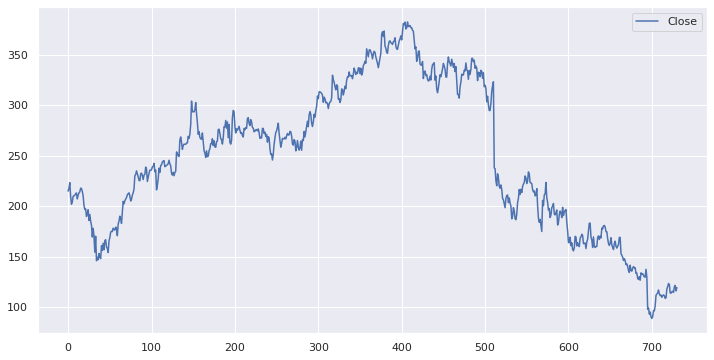

In [ ]:
df[['Close']].plot(figsize=(12,6));


Tendencia

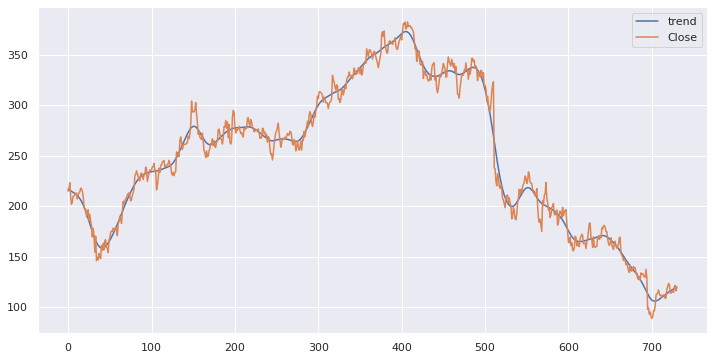

In [ ]:
from statsmodels.tsa.filters.hp_filter import hpfilter
gdp_cycle, gdp_trend = hpfilter(df['Close'], lamb=1600)
df['trend'] = gdp_trend
df[['trend','Close']].plot(figsize=(12,6))
#tendencia

Prueba de estacionalidad



In [ ]:
sts.adfuller(df.Close)
#no se rechaza la hipotesis nula
#la serie no es estacionaria

(-0.6390597415337104,
 0.8619096606880865,
 1,
 729,
 {'1%': -3.4393520240470554,
  '5%': -2.8655128165959236,
  '10%': -2.5688855736949163},
 4792.533609894443)

QQ Plot

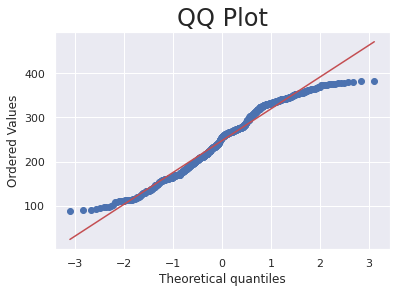

In [ ]:
import scipy.stats

scipy.stats.probplot(df.Close, plot =  plt)
plt.title("QQ Plot", size = 24)
plt.show()

Creando los retornos

In [ ]:
df['returns'] = df.Close.pct_change(1)*100


Creando los retornos al cuadrado

In [ ]:
df['sq_returns'] = df.returns.mul(df.returns)


Retonos vs Retornos al cuadrado

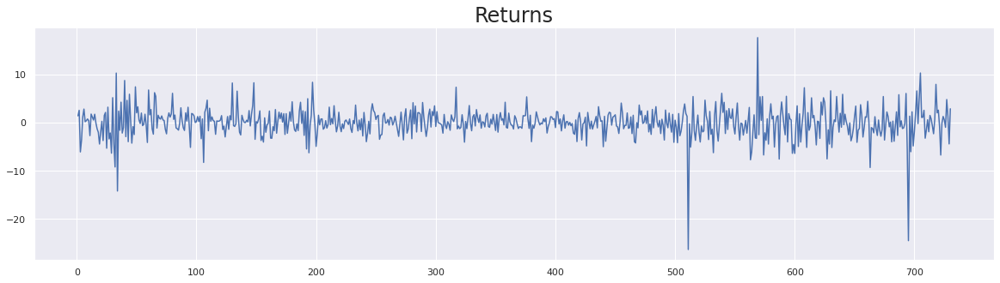

In [ ]:
df.returns.plot(figsize=(20,5))
plt.title("Returns", size = 24)
plt.show()

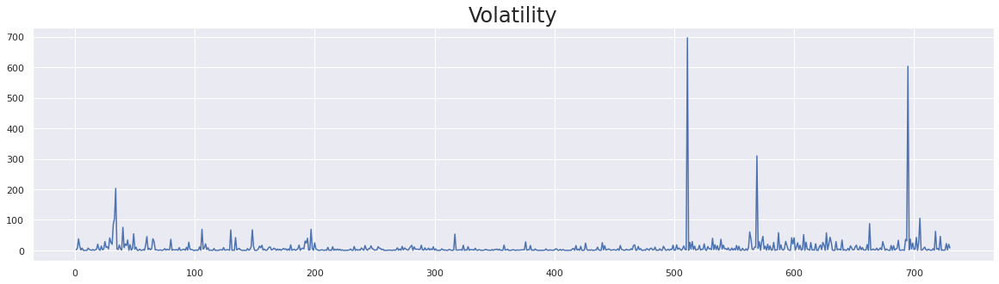

In [ ]:
df.sq_returns.plot(figsize=(20,5))
plt.title("Volatility", size = 24)
plt.show()

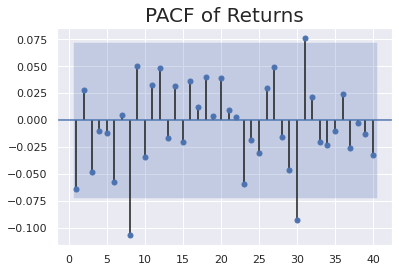

In [ ]:
sgt.plot_pacf(df.returns[1:], lags = 40, alpha = 0.05, zero = False , method = ('ols'))
plt.title("PACF of Returns", size = 20)
plt.show()

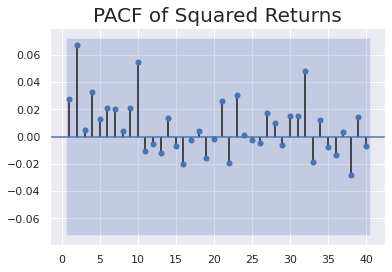

In [ ]:
sgt.plot_pacf(df.sq_returns[1:], lags = 40, alpha = 0.05, zero = False , method = ('ols'))
plt.title("PACF of Squared Returns", size = 20)
plt.show()

The arch_model() Method

In [ ]:
!pip install arch


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 907 kB 9.0 MB/s 


In [ ]:
from arch import arch_model


In [ ]:
display(Math(r'\sigma_{t}^2 = \omega_0 + \sum_{i=1}^p \alpha_1\in_{t-1}^2'))
#Modelo ARCH 

<IPython.core.display.Math object>

The Simple ARCH(1)

In [ ]:
model_arch_1 = arch_model(df.returns[1:], mean = "Constant", vol = "ARCH", p = 1)
results_arch_1 = model_arch_1.fit(update_freq = 1)
results_arch_1.summary()

Iteration:      1,   Func. Count:      5,   Neg. LLF: 2122.244647170468
Iteration:      2,   Func. Count:     11,   Neg. LLF: 1926.0996092736887
Iteration:      3,   Func. Count:     17,   Neg. LLF: 1863.653931935662
Iteration:      4,   Func. Count:     22,   Neg. LLF: 1847.440017406929
Iteration:      5,   Func. Count:     26,   Neg. LLF: 1847.4400067053662
Iteration:      6,   Func. Count:     29,   Neg. LLF: 1847.4400067053434
Optimization terminated successfully    (Exit mode 0)
            Current function value: 1847.4400067053662
            Iterations: 6
            Function evaluations: 29
            Gradient evaluations: 6


<class 'statsmodels.iolib.summary.Summary'>
"""
                      Constant Mean - ARCH Model Results                      
==============================================================================
Dep. Variable:                returns   R-squared:                       0.000
Mean Model:             Constant Mean   Adj. R-squared:                  0.000
Vol Model:                       ARCH   Log-Likelihood:               -1847.44
Distribution:                  Normal   AIC:                           3700.88
Method:            Maximum Likelihood   BIC:                           3714.66
                                        No. Observations:                  730
Date:                Sun, Dec 18 2022   Df Residuals:                      729
Time:                        23:12:08   Df Model:                            1
                                Mean Model                               
=========================================================================
                  coef    std err          t      P>|t|  95.0% Conf. Int.
-------------------------------------------------------------------------
mu         -6.8213e-04      0.123 -5.554e-03      0.996 [ -0.241,  0.240]
                              Volatility Model                             
===========================================================================
                 coef    std err          t      P>|t|     95.0% Conf. Int.
---------------------------------------------------------------------------
omega          7.5968      1.433      5.301  1.154e-07    [  4.788, 10.406]
alpha[1]       0.2651      0.180      1.473      0.141 [-8.759e-02,  0.618]
===========================================================================

Covariance estimator: robust
"""

Higher-Lag ARCH Models

In [ ]:
model_arch_2 = arch_model(df.returns[1:], mean = "Constant", vol = "ARCH", p = 2)
results_arch_2 = model_arch_2.fit(update_freq = 5)
results_arch_2.summary()

Iteration:      5,   Func. Count:     31,   Neg. LLF: 1837.2673670201293
Optimization terminated successfully    (Exit mode 0)
            Current function value: 1835.0316505910216
            Iterations: 9
            Function evaluations: 53
            Gradient evaluations: 9


<class 'statsmodels.iolib.summary.Summary'>
"""
                      Constant Mean - ARCH Model Results                      
==============================================================================
Dep. Variable:                returns   R-squared:                       0.000
Mean Model:             Constant Mean   Adj. R-squared:                  0.000
Vol Model:                       ARCH   Log-Likelihood:               -1835.03
Distribution:                  Normal   AIC:                           3678.06
Method:            Maximum Likelihood   BIC:                           3696.44
                                        No. Observations:                  730
Date:                Sun, Dec 18 2022   Df Residuals:                      729
Time:                        23:12:31   Df Model:                            1
                               Mean Model                               
========================================================================
                 coef    std err          t      P>|t|  95.0% Conf. Int.
------------------------------------------------------------------------
mu            -0.0416      0.147     -0.282      0.778 [ -0.330,  0.247]
                            Volatility Model                            
========================================================================
                 coef    std err          t      P>|t|  95.0% Conf. Int.
------------------------------------------------------------------------
omega          6.3058      1.591      3.964  7.385e-05 [  3.188,  9.424]
alpha[1]       0.0596      0.178      0.335      0.738 [ -0.289,  0.409]
alpha[2]       0.3887      0.266      1.460      0.144 [ -0.133,  0.911]
========================================================================

Covariance estimator: robust
"""

In [ ]:
model_arch_3 = arch_model(df.returns[1:], mean = "Constant", vol = "ARCH", p = 3)
results_arch_3 = model_arch_3.fit(update_freq = 5)
results_arch_3.summary()

Iteration:      5,   Func. Count:     37,   Neg. LLF: 1822.4785480507107
Iteration:     10,   Func. Count:     67,   Neg. LLF: 1822.1439891022928
Optimization terminated successfully    (Exit mode 0)
            Current function value: 1822.143983957139
            Iterations: 12
            Function evaluations: 78
            Gradient evaluations: 12


<class 'statsmodels.iolib.summary.Summary'>
"""
                      Constant Mean - ARCH Model Results                      
==============================================================================
Dep. Variable:                returns   R-squared:                       0.000
Mean Model:             Constant Mean   Adj. R-squared:                  0.000
Vol Model:                       ARCH   Log-Likelihood:               -1822.14
Distribution:                  Normal   AIC:                           3654.29
Method:            Maximum Likelihood   BIC:                           3677.25
                                        No. Observations:                  730
Date:                Sun, Dec 18 2022   Df Residuals:                      729
Time:                        23:12:38   Df Model:                            1
                               Mean Model                               
========================================================================
                 coef    std err          t      P>|t|  95.0% Conf. Int.
------------------------------------------------------------------------
mu            -0.0529      0.140     -0.376      0.707 [ -0.328,  0.222]
                               Volatility Model                              
=============================================================================
                 coef    std err          t      P>|t|       95.0% Conf. Int.
-----------------------------------------------------------------------------
omega          4.4496      0.830      5.358  8.401e-08      [  2.822,  6.077]
alpha[1]   1.8011e-10  1.293e-02  1.393e-08      1.000 [-2.534e-02,2.534e-02]
alpha[2]       0.4607      0.220      2.094  3.629e-02    [2.943e-02,  0.892]
alpha[3]       0.3065      0.235      1.306      0.192      [ -0.154,  0.767]
=============================================================================

Covariance estimator: robust
"""

In [ ]:
model_arch_13 = arch_model(df.returns[1:], mean = "Constant", vol = "ARCH", p = 13)
results_arch_13 = model_arch_13.fit(update_freq = 5)
results_arch_13.summary()

Iteration:      5,   Func. Count:     86,   Neg. LLF: 1916.0844601179429
Iteration:     10,   Func. Count:    171,   Neg. LLF: 2202.5933018970213
Iteration:     15,   Func. Count:    257,   Neg. LLF: 1827.0276205896243
Iteration:     20,   Func. Count:    340,   Neg. LLF: 1806.5993478210803
Optimization terminated successfully    (Exit mode 0)
            Current function value: 1806.5993478210803
            Iterations: 21
            Function evaluations: 355
            Gradient evaluations: 21


<class 'statsmodels.iolib.summary.Summary'>
"""
                      Constant Mean - ARCH Model Results                      
==============================================================================
Dep. Variable:                returns   R-squared:                       0.000
Mean Model:             Constant Mean   Adj. R-squared:                  0.000
Vol Model:                       ARCH   Log-Likelihood:               -1806.60
Distribution:                  Normal   AIC:                           3643.20
Method:            Maximum Likelihood   BIC:                           3712.09
                                        No. Observations:                  730
Date:                Sun, Dec 18 2022   Df Residuals:                      729
Time:                        23:12:50   Df Model:                            1
                               Mean Model                               
========================================================================
                 coef    std err          t      P>|t|  95.0% Conf. Int.
------------------------------------------------------------------------
mu             0.0428      0.315      0.136      0.892 [ -0.575,  0.661]
                               Volatility Model                              
=============================================================================
                 coef    std err          t      P>|t|       95.0% Conf. Int.
-----------------------------------------------------------------------------
omega          2.4846      1.553      1.600      0.110      [ -0.559,  5.529]
alpha[1]   9.4701e-11  1.813e-02  5.222e-09      1.000 [-3.554e-02,3.554e-02]
alpha[2]       0.3880      0.232      1.671  9.466e-02   [-6.701e-02,  0.843]
alpha[3]       0.0491      0.248      0.198      0.843      [ -0.436,  0.534]
alpha[4]       0.1476      0.129      1.148      0.251      [ -0.104,  0.400]
alpha[5]   4.4644e-11  6.621e-02  6.743e-10      1.000      [ -0.130,  0.130]
alpha[6]       0.1327      0.117      1.137      0.255   [-9.598e-02,  0.361]
alpha[7]   2.8427e-03  5.735e-02  4.957e-02      0.960      [ -0.110,  0.115]
alpha[8]   1.2802e-10  3.708e-02  3.453e-09      1.000 [-7.268e-02,7.268e-02]
alpha[9]       0.2342      0.463      0.506      0.613      [ -0.673,  1.141]
alpha[10]      0.0181  1.775e-02      1.019      0.308 [-1.670e-02,5.286e-02]
alpha[11]      0.0275      0.192      0.143      0.886      [ -0.350,  0.405]
alpha[12]  1.3367e-10  4.174e-02  3.202e-09      1.000 [-8.182e-02,8.182e-02]
alpha[13]  8.9804e-11      0.222  4.047e-10      1.000      [ -0.435,  0.435]
=============================================================================

Covariance estimator: robust
"""

In [ ]:
display(Math(r'\sigma_t^2 = \Omega + \sum_{i=1}^p\alpha_1\in_{t-1}^2 + \sum_{j=1}^p\beta_1\sigma_{t-1}^2'))
#Modelo GARCH

<IPython.core.display.Math object>

The Simple GARCH Model

In [ ]:
model_garch_1_1 = arch_model(df.returns[1:], mean = "Constant", vol = "GARCH", p = 1, q = 1)
results_garch_1_1 = model_garch_1_1.fit(update_freq = 5)
results_garch_1_1.summary()

Iteration:      5,   Func. Count:     34,   Neg. LLF: 2057.329131313439
Iteration:     10,   Func. Count:     59,   Neg. LLF: 1823.7622343767348
Optimization terminated successfully    (Exit mode 0)
            Current function value: 1823.7622343766427
            Iterations: 10
            Function evaluations: 59
            Gradient evaluations: 10


<class 'statsmodels.iolib.summary.Summary'>
"""
                     Constant Mean - GARCH Model Results                      
==============================================================================
Dep. Variable:                returns   R-squared:                       0.000
Mean Model:             Constant Mean   Adj. R-squared:                  0.000
Vol Model:                      GARCH   Log-Likelihood:               -1823.76
Distribution:                  Normal   AIC:                           3655.52
Method:            Maximum Likelihood   BIC:                           3673.90
                                        No. Observations:                  730
Date:                Sun, Dec 18 2022   Df Residuals:                      729
Time:                        23:13:08   Df Model:                            1
                               Mean Model                               
========================================================================
                 coef    std err          t      P>|t|  95.0% Conf. Int.
------------------------------------------------------------------------
mu            -0.0640      0.176     -0.363      0.716 [ -0.409,  0.281]
                              Volatility Model                             
===========================================================================
                 coef    std err          t      P>|t|     95.0% Conf. Int.
---------------------------------------------------------------------------
omega          0.9020      0.528      1.707  8.775e-02    [ -0.133,  1.937]
alpha[1]       0.2125      0.139      1.533      0.125 [-5.923e-02,  0.484]
beta[1]        0.7338      0.113      6.519  7.069e-11    [  0.513,  0.954]
===========================================================================

Covariance estimator: robust
"""

Higher-Lag GARCH Models

In [ ]:
model_garch_1_2 = arch_model(df.returns[1:], mean = "Constant",  vol = "GARCH", p = 1, q = 2)
results_garch_1_2 = model_garch_1_2.fit(update_freq = 5)
results_garch_1_2.summary()

Iteration:      5,   Func. Count:     38,   Neg. LLF: 1824.0034270065642
Iteration:     10,   Func. Count:     67,   Neg. LLF: 1823.7622348313032
Optimization terminated successfully    (Exit mode 0)
            Current function value: 1823.7622347079196
            Iterations: 10
            Function evaluations: 67
            Gradient evaluations: 10


<class 'statsmodels.iolib.summary.Summary'>
"""
                     Constant Mean - GARCH Model Results                      
==============================================================================
Dep. Variable:                returns   R-squared:                       0.000
Mean Model:             Constant Mean   Adj. R-squared:                  0.000
Vol Model:                      GARCH   Log-Likelihood:               -1823.76
Distribution:                  Normal   AIC:                           3657.52
Method:            Maximum Likelihood   BIC:                           3680.49
                                        No. Observations:                  730
Date:                Sun, Dec 18 2022   Df Residuals:                      729
Time:                        23:13:20   Df Model:                            1
                               Mean Model                               
========================================================================
                 coef    std err          t      P>|t|  95.0% Conf. Int.
------------------------------------------------------------------------
mu            -0.0640      0.107     -0.600      0.548 [ -0.273,  0.145]
                            Volatility Model                            
========================================================================
                 coef    std err          t      P>|t|  95.0% Conf. Int.
------------------------------------------------------------------------
omega          0.9021      1.311      0.688      0.492 [ -1.668,  3.473]
alpha[1]       0.2125      0.217      0.981      0.327 [ -0.212,  0.637]
beta[1]        0.7338      2.836      0.259      0.796 [ -4.825,  6.292]
beta[2]        0.0000      2.546      0.000      1.000 [ -4.989,  4.989]
========================================================================

Covariance estimator: robust
"""

In [ ]:
model_garch_1_3 = arch_model(df.returns[1:], mean = "Constant",  vol = "GARCH", p = 1, q = 3)
results_garch_1_3 = model_garch_1_3.fit(update_freq = 5)
results_garch_1_3.summary()

Iteration:      5,   Func. Count:     43,   Neg. LLF: 1823.8993873416844
Iteration:     10,   Func. Count:     78,   Neg. LLF: 1823.7622344709964
Optimization terminated successfully    (Exit mode 0)
            Current function value: 1823.7622344709964
            Iterations: 10
            Function evaluations: 78
            Gradient evaluations: 10


<class 'statsmodels.iolib.summary.Summary'>
"""
                     Constant Mean - GARCH Model Results                      
==============================================================================
Dep. Variable:                returns   R-squared:                       0.000
Mean Model:             Constant Mean   Adj. R-squared:                  0.000
Vol Model:                      GARCH   Log-Likelihood:               -1823.76
Distribution:                  Normal   AIC:                           3659.52
Method:            Maximum Likelihood   BIC:                           3687.08
                                        No. Observations:                  730
Date:                Sun, Dec 18 2022   Df Residuals:                      729
Time:                        23:13:25   Df Model:                            1
                               Mean Model                               
========================================================================
                 coef    std err          t      P>|t|  95.0% Conf. Int.
------------------------------------------------------------------------
mu            -0.0640      0.156     -0.410      0.682 [ -0.370,  0.242]
                            Volatility Model                            
========================================================================
                 coef    std err          t      P>|t|  95.0% Conf. Int.
------------------------------------------------------------------------
omega          0.9020      1.174      0.768      0.442 [ -1.399,  3.203]
alpha[1]       0.2125      0.243      0.874      0.382 [ -0.264,  0.689]
beta[1]        0.7338      2.016      0.364      0.716 [ -3.218,  4.686]
beta[2]    4.1329e-09      2.495  1.657e-09      1.000 [ -4.889,  4.889]
beta[3]    4.1561e-09      0.824  5.043e-09      1.000 [ -1.615,  1.615]
========================================================================

Covariance estimator: robust
"""

In [ ]:
model_garch_2_1 = arch_model(df.returns[1:], mean = "Constant",  vol = "GARCH", p = 2, q = 1)
results_garch_2_1 = model_garch_2_1.fit(update_freq = 5)
results_garch_2_1.summary()

Iteration:      5,   Func. Count:     37,   Neg. LLF: 1816.6744591593501
Iteration:     10,   Func. Count:     70,   Neg. LLF: 1815.0810513889846
Optimization terminated successfully    (Exit mode 0)
            Current function value: 1815.079982471767
            Iterations: 14
            Function evaluations: 93
            Gradient evaluations: 14


<class 'statsmodels.iolib.summary.Summary'>
"""
                     Constant Mean - GARCH Model Results                      
==============================================================================
Dep. Variable:                returns   R-squared:                       0.000
Mean Model:             Constant Mean   Adj. R-squared:                  0.000
Vol Model:                      GARCH   Log-Likelihood:               -1815.08
Distribution:                  Normal   AIC:                           3640.16
Method:            Maximum Likelihood   BIC:                           3663.13
                                        No. Observations:                  730
Date:                Sun, Dec 18 2022   Df Residuals:                      729
Time:                        23:13:32   Df Model:                            1
                               Mean Model                               
========================================================================
                 coef    std err          t      P>|t|  95.0% Conf. Int.
------------------------------------------------------------------------
mu            -0.0674      0.150     -0.450      0.653 [ -0.361,  0.226]
                               Volatility Model                              
=============================================================================
                 coef    std err          t      P>|t|       95.0% Conf. Int.
-----------------------------------------------------------------------------
omega          1.5194      0.596      2.548  1.082e-02      [  0.351,  2.688]
alpha[1]       0.0000  1.672e-02      0.000      1.000 [-3.277e-02,3.277e-02]
alpha[2]       0.4540      0.244      1.861  6.278e-02   [-2.421e-02,  0.932]
beta[1]        0.5128      0.126      4.082  4.460e-05      [  0.267,  0.759]
=============================================================================

Covariance estimator: robust
"""

In [ ]:
model_garch_3_1 = arch_model(df.returns[1:], mean = "Constant",  vol = "GARCH", p = 3, q = 1)
results_garch_3_1 = model_garch_3_1.fit(update_freq = 5)
results_garch_3_1.summary()

Iteration:      5,   Func. Count:     42,   Neg. LLF: 1818.0163366700517
Iteration:     10,   Func. Count:     81,   Neg. LLF: 1814.9507236514448
Optimization terminated successfully    (Exit mode 0)
            Current function value: 1814.9450553428621
            Iterations: 14
            Function evaluations: 108
            Gradient evaluations: 14


<class 'statsmodels.iolib.summary.Summary'>
"""
                     Constant Mean - GARCH Model Results                      
==============================================================================
Dep. Variable:                returns   R-squared:                       0.000
Mean Model:             Constant Mean   Adj. R-squared:                  0.000
Vol Model:                      GARCH   Log-Likelihood:               -1814.95
Distribution:                  Normal   AIC:                           3641.89
Method:            Maximum Likelihood   BIC:                           3669.45
                                        No. Observations:                  730
Date:                Sun, Dec 18 2022   Df Residuals:                      729
Time:                        23:13:38   Df Model:                            1
                               Mean Model                               
========================================================================
                 coef    std err          t      P>|t|  95.0% Conf. Int.
------------------------------------------------------------------------
mu            -0.0638      0.125     -0.512      0.609 [ -0.308,  0.181]
                               Volatility Model                              
=============================================================================
                 coef    std err          t      P>|t|       95.0% Conf. Int.
-----------------------------------------------------------------------------
omega          1.6787      1.185      1.417      0.157      [ -0.643,  4.001]
alpha[1]       0.0000  1.686e-02      0.000      1.000 [-3.305e-02,3.305e-02]
alpha[2]       0.4416      0.226      1.957  5.036e-02   [-6.952e-04,  0.884]
alpha[3]       0.0690      0.458      0.151      0.880      [ -0.828,  0.966]
beta[1]        0.4586      0.371      1.237      0.216      [ -0.268,  1.186]
=============================================================================

Covariance estimator: robust
"""

The simple EGARCH model

In [ ]:
display(Math(r'ln\sigma_{t}^2 = \omega_0 + \sum_{i=1}^p\alpha_i(|\in_{t-i}|+\gamma_i\in_{t_i}) + \sum_{j=1}^q\beta_j\ln\sigma_{t-j}^2'))
#Modelo EGARCH

<IPython.core.display.Math object>

In [ ]:
model_garch_3_1 = arch_model(df.returns[1:], mean = "Constant",  vol = "EGARCH", p = 1, o = 1, q = 1)
results_garch_3_1 = model_garch_3_1.fit(update_freq = 5)
results_garch_3_1.summary()

Iteration:      5,   Func. Count:     48,   Neg. LLF: 4773.990662731206
Iteration:     10,   Func. Count:     88,   Neg. LLF: 1809.5008010711435
Iteration:     15,   Func. Count:    121,   Neg. LLF: 5079.933547735579
Iteration:     20,   Func. Count:    160,   Neg. LLF: 5844.261936826428
Iteration:     25,   Func. Count:    200,   Neg. LLF: 13803437.915530458
Iteration:     30,   Func. Count:    237,   Neg. LLF: 1785.8418808684798
Iteration:     35,   Func. Count:    271,   Neg. LLF: 3388.9925187501794
Iteration:     40,   Func. Count:    306,   Neg. LLF: 3576.742632478791
Iteration:     45,   Func. Count:    361,   Neg. LLF: 2463.8757296507392
Iteration:     50,   Func. Count:    441,   Neg. LLF: 5886.3931807674235
Iteration:     55,   Func. Count:    521,   Neg. LLF: 4460.14835424036
Iteration:     60,   Func. Count:    601,   Neg. LLF: 4190.9189895512745
Iteration:     65,   Func. Count:    681,   Neg. LLF: 3914.8675659979986
Iteration:     70,   Func. Count:    761,   Neg. LLF: 369

<class 'statsmodels.iolib.summary.Summary'>
"""
                     Constant Mean - EGARCH Model Results                     
==============================================================================
Dep. Variable:                returns   R-squared:                       0.000
Mean Model:             Constant Mean   Adj. R-squared:                  0.000
Vol Model:                     EGARCH   Log-Likelihood:               -1781.19
Distribution:                  Normal   AIC:                           3572.37
Method:            Maximum Likelihood   BIC:                           3595.34
                                        No. Observations:                  730
Date:                Sun, Dec 18 2022   Df Residuals:                      729
Time:                        23:13:57   Df Model:                            1
                               Mean Model                               
========================================================================
                 coef    std err          t      P>|t|  95.0% Conf. Int.
------------------------------------------------------------------------
mu            -0.2171  2.267e-04   -957.833      0.000 [ -0.218, -0.217]
                               Volatility Model                               
==============================================================================
                 coef    std err          t      P>|t|        95.0% Conf. Int.
------------------------------------------------------------------------------
omega          0.0205  4.635e-12  4.420e+09      0.000   [2.049e-02,2.049e-02]
alpha[1]      -0.0473  6.584e-05   -718.282      0.000 [-4.742e-02,-4.717e-02]
gamma[1]      -0.0522  6.675e-05   -781.353      0.000 [-5.229e-02,-5.203e-02]
beta[1]        0.9914  1.276e-12  7.767e+11      0.000       [  0.991,  0.991]
==============================================================================

Covariance estimator: robust
"""

The GJR-GARCH model

In [ ]:
display(Math(r'\sigma_t^2 = \omega + \sum_{i=1}^p\alpha\in_{t-1}^2 + \gamma\in_{t-1}^2I_{|\in_{t-1}<0|} + \sum_{j=1}^p\beta\sigma_{t-1}^2 '))
#modelo GJR-GARCH

<IPython.core.display.Math object>

In [ ]:
am = arch_model(df.returns[1:], p=1, o=1, q=1)
res = am.fit(update_freq=5, disp="off")
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                   Constant Mean - GJR-GARCH Model Results                    
==============================================================================
Dep. Variable:                returns   R-squared:                       0.000
Mean Model:             Constant Mean   Adj. R-squared:                  0.000
Vol Model:                  GJR-GARCH   Log-Likelihood:               -1823.63
Distribution:                  Normal   AIC:                           3657.26
Method:            Maximum Likelihood   BIC:                           3680.23
                                        No. Observations:                  730
Date:                Sun, Dec 18 2022   Df Residuals:                      729
Time:                        23:14:21   Df Model:                            1
                               Mean Model                               
========================================================================
                 coef    std err          t      P>|t|  95.0% Conf. Int.
------------------------------------------------------------------------
mu            -0.0519      0.114     -0.456      0.648 [ -0.275,  0.171]
                            Volatility Model                            
========================================================================
                 coef    std err          t      P>|t|  95.0% Conf. Int.
------------------------------------------------------------------------
omega          0.9281      0.604      1.538      0.124 [ -0.255,  2.111]
alpha[1]       0.2497      0.342      0.730      0.465 [ -0.421,  0.920]
gamma[1]      -0.0485      0.338     -0.144      0.886 [ -0.711,  0.614]
beta[1]        0.7222      0.151      4.773  1.814e-06 [  0.426,  1.019]
========================================================================

Covariance estimator: robust
"""

The TARCH model

In [ ]:
display(Math(r'\sigma_t = \omega + \sum_{p=1}^1\alpha\in_{t-1} + \sum_{o=1}^o\gamma\in_{t-1}I_{|\in_{t-1}<0|} + \sum_{q=1}^q\beta\sigma_{t-1}'))
#modelo TARCH

<IPython.core.display.Math object>

In [ ]:
am = arch_model(df.returns[1:], p=1, o=1, q=1, power=1.0)
res = am.fit(update_freq=5)
res.summary()

Iteration:      5,   Func. Count:     41,   Neg. LLF: 1812.0081688366913
Iteration:     10,   Func. Count:     74,   Neg. LLF: 1811.2999781491262
Iteration:     15,   Func. Count:    107,   Neg. LLF: 1811.2997609590586
Optimization terminated successfully    (Exit mode 0)
            Current function value: 1811.299691783011
            Iterations: 15
            Function evaluations: 109
            Gradient evaluations: 15


<class 'statsmodels.iolib.summary.Summary'>
"""
                  Constant Mean - TARCH/ZARCH Model Results                   
==============================================================================
Dep. Variable:                returns   R-squared:                       0.000
Mean Model:             Constant Mean   Adj. R-squared:                  0.000
Vol Model:                TARCH/ZARCH   Log-Likelihood:               -1811.30
Distribution:                  Normal   AIC:                           3632.60
Method:            Maximum Likelihood   BIC:                           3655.56
                                        No. Observations:                  730
Date:                Sun, Dec 18 2022   Df Residuals:                      729
Time:                        23:14:39   Df Model:                            1
                                  Mean Model                                  
==============================================================================
                 coef    std err          t      P>|t|        95.0% Conf. Int.
------------------------------------------------------------------------------
mu            -0.0676  2.549e-03    -26.520 5.680e-155 [-7.259e-02,-6.260e-02]
                              Volatility Model                             
===========================================================================
                 coef    std err          t      P>|t|     95.0% Conf. Int.
---------------------------------------------------------------------------
omega          0.2720      0.165      1.647  9.965e-02 [-5.177e-02,  0.596]
alpha[1]       0.2596      0.212      1.222      0.222    [ -0.157,  0.676]
gamma[1]      -0.0551      0.190     -0.290      0.772    [ -0.428,  0.318]
beta[1]        0.7500      0.120      6.253  4.022e-10    [  0.515,  0.985]
===========================================================================

Covariance estimator: robust
"""

The FIGARCH model

In [ ]:
display(Math(r'h_t = \omega + [1 - \beta\ L - \phi\ L(1-L)^\delta]\in_t^2 + \beta\ h_{t-1}'))
#modelo FIGARCH

<IPython.core.display.Math object>

In [ ]:
from arch.univariate import FIGARCH

In [ ]:
am = arch_model(df.returns[1:], p=1, q=1, power=2.0, vol = "FIGARCH" )
res = am.fit(update_freq=5)
res.summary()

Iteration:      5,   Func. Count:     37,   Neg. LLF: 1860.6893716575833
Iteration:     10,   Func. Count:     69,   Neg. LLF: 1820.3878600704707
Optimization terminated successfully    (Exit mode 0)
            Current function value: 1820.3876421987045
            Iterations: 13
            Function evaluations: 86
            Gradient evaluations: 13


<class 'statsmodels.iolib.summary.Summary'>
"""
                    Constant Mean - FIGARCH Model Results                     
==============================================================================
Dep. Variable:                returns   R-squared:                       0.000
Mean Model:             Constant Mean   Adj. R-squared:                  0.000
Vol Model:                    FIGARCH   Log-Likelihood:               -1820.39
Distribution:                  Normal   AIC:                           3650.78
Method:            Maximum Likelihood   BIC:                           3673.74
                                        No. Observations:                  730
Date:                Sun, Dec 18 2022   Df Residuals:                      729
Time:                        23:15:06   Df Model:                            1
                               Mean Model                               
========================================================================
                 coef    std err          t      P>|t|  95.0% Conf. Int.
------------------------------------------------------------------------
mu            -0.0789      2.373 -3.325e-02      0.973 [ -4.729,  4.572]
                               Volatility Model                              
=============================================================================
                 coef    std err          t      P>|t|       95.0% Conf. Int.
-----------------------------------------------------------------------------
omega          1.0334    177.399  5.825e-03      0.995 [-3.467e+02,3.487e+02]
phi            0.0000    387.622      0.000      1.000 [-7.597e+02,7.597e+02]
d              0.6229    148.015  4.209e-03      0.997 [-2.895e+02,2.907e+02]
beta           0.4639     94.888  4.889e-03      0.996 [-1.855e+02,1.864e+02]
=============================================================================

Covariance estimator: robust
"""

The HARCH model

In [ ]:
display(Math(r'\sigma_t^2 = \omega + \in_{i=1}^m \alpha_l(l_i^{-1} \sum_{j+1}^l \in_{t-j}^2)'))
#modelo HARCH

<IPython.core.display.Math object>

In [ ]:
from arch.univariate import HARCH

In [ ]:
am = arch_model(df.returns[1:], p=1, q=1, power=2.0, vol = "HARCH" )
res = am.fit(update_freq=5)
res.summary()

Iteration:      5,   Func. Count:     34,   Neg. LLF: 1978.3157978602683
Iteration:     10,   Func. Count:     55,   Neg. LLF: 1847.5457283569167
Iteration:     15,   Func. Count:     74,   Neg. LLF: 1847.4400067230422
Optimization terminated successfully    (Exit mode 0)
            Current function value: 1847.440006723032
            Iterations: 15
            Function evaluations: 74
            Gradient evaluations: 15


<class 'statsmodels.iolib.summary.Summary'>
"""
                     Constant Mean - HARCH Model Results                      
==============================================================================
Dep. Variable:                returns   R-squared:                       0.000
Mean Model:             Constant Mean   Adj. R-squared:                  0.000
Vol Model:                      HARCH   Log-Likelihood:               -1847.44
Distribution:                  Normal   AIC:                           3700.88
Method:            Maximum Likelihood   BIC:                           3714.66
                                        No. Observations:                  730
Date:                Sun, Dec 18 2022   Df Residuals:                      729
Time:                        23:15:31   Df Model:                            1
                                Mean Model                               
=========================================================================
                  coef    std err          t      P>|t|  95.0% Conf. Int.
-------------------------------------------------------------------------
mu         -7.0120e-04      0.123 -5.709e-03      0.995 [ -0.241,  0.240]
                              Volatility Model                             
===========================================================================
                 coef    std err          t      P>|t|     95.0% Conf. Int.
---------------------------------------------------------------------------
omega          7.5969      1.433      5.301  1.155e-07    [  4.788, 10.406]
alpha[1]       0.2651      0.180      1.473      0.141 [-8.759e-02,  0.618]
===========================================================================

Covariance estimator: robust
"""

The APARCH model

In [ ]:
display(Math(r'\sigma_t^\delta = \omega + \sum_{i=1}^p\alpha_i(|\in_{t-1}|-\gamma_i\ I_{[0>i]}\in_{t-i})^\delta + \sum_{k=1}^q \beta_k \sigma_{t-k}^\delta'))
#modelo APARCH

<IPython.core.display.Math object>

In [ ]:
from arch.univariate import APARCH


In [ ]:
am = arch_model(df.returns[1:], p=1, o=1, q=1, power=2.0, vol = "APARCH" )
res = am.fit(update_freq=5)
res.summary()

Iteration:      5,   Func. Count:     43,   Neg. LLF: 5568.279625701638
Iteration:     10,   Func. Count:     84,   Neg. LLF: 96217208.17858495
Iteration:     15,   Func. Count:    127,   Neg. LLF: 3385.711756445044
Iteration:     20,   Func. Count:    169,   Neg. LLF: 1875.5909709912444
Iteration:     25,   Func. Count:    209,   Neg. LLF: 1808.8980108561213
Iteration:     30,   Func. Count:    255,   Neg. LLF: 1808.7797237141385
Optimization terminated successfully    (Exit mode 0)
            Current function value: 1808.7794790428384
            Iterations: 33
            Function evaluations: 283
            Gradient evaluations: 32


<class 'statsmodels.iolib.summary.Summary'>
"""
                     Constant Mean - APARCH Model Results                     
==============================================================================
Dep. Variable:                returns   R-squared:                       0.000
Mean Model:             Constant Mean   Adj. R-squared:                  0.000
Vol Model:                     APARCH   Log-Likelihood:               -1808.78
Distribution:                  Normal   AIC:                           3629.56
Method:            Maximum Likelihood   BIC:                           3657.12
                                        No. Observations:                  730
Date:                Sun, Dec 18 2022   Df Residuals:                      729
Time:                        23:15:57   Df Model:                            1
                                  Mean Model                                  
==============================================================================
                 coef    std err          t      P>|t|        95.0% Conf. Int.
------------------------------------------------------------------------------
mu            -0.0224  4.500e-04    -49.692      0.000 [-2.324e-02,-2.148e-02]
                              Volatility Model                             
===========================================================================
                 coef    std err          t      P>|t|     95.0% Conf. Int.
---------------------------------------------------------------------------
omega          0.1865  9.560e-02      1.951  5.111e-02 [-9.034e-04,  0.374]
alpha[1]       0.2048  8.858e-02      2.312  2.078e-02  [3.118e-02,  0.378]
gamma[1]      -0.1933      0.382     -0.506      0.613    [ -0.942,  0.555]
beta[1]        0.7391  9.476e-02      7.799  6.223e-15    [  0.553,  0.925]
delta          0.5061      0.411      1.232      0.218    [ -0.299,  1.311]
===========================================================================

Covariance estimator: robust
"""

In [ ]:
from scipy import stats


In [ ]:
jarque_bera_test = stats.jarque_bera(df.Close)
jarque_bera_test


Jarque_beraResult(statistic=31.14146075205856, pvalue=1.7286923836845602e-07)

In [ ]:
jarque_bera_test.statistic

31.14146075205856

In [ ]:
jarque_bera_test.pvalue

1.7286923836845602e-07

jarquer-bera para los retornos

In [ ]:
returns = df.returns[1:]
returns

1      1.358960
2      2.497820
3     -6.137167
4     -3.636708
5      1.129215
         ...   
726   -1.026750
727    4.742397
728    1.198497
729   -4.474047
730    2.823933
Name: returns, Length: 730, dtype: float64

In [ ]:
jarque_bera_test = stats.jarque_bera(returns)
jarque_bera_test

Jarque_beraResult(statistic=6072.268565896995, pvalue=0.0)

In [ ]:
jarque_bera_test.statistic

6072.268565896995

In [ ]:
jarque_bera_test.pvalue

0.0

curtosis

In [ ]:
returns.kurt()

13.998115091352666

coef. asimetria

In [ ]:
returns.skew()

-1.2859074142586784

In [ ]:
from arch.unitroot import PhillipsPerron

pp = PhillipsPerron(df.returns[1:])
print(pp.summary().as_text())

     Phillips-Perron Test (Z-tau)    
Test Statistic                -28.924
P-value                         0.000
Lags                               20
-------------------------------------

Trend: Constant
Critical Values: -3.44 (1%), -2.87 (5%), -2.57 (10%)
Null Hypothesis: The process contains a unit root.
Alternative Hypothesis: The process is weakly stationary.


In [ ]:
from arch.unitroot import DFGLS

dfgls = DFGLS(df.returns[1:])
print(dfgls.summary().as_text())

      Dickey-Fuller GLS Results      
Test Statistic                -24.437
P-value                         0.000
Lags                                0
-------------------------------------

Trend: Constant
Critical Values: -2.60 (1%), -1.97 (5%), -1.65 (10%)
Null Hypothesis: The process contains a unit root.
Alternative Hypothesis: The process is weakly stationary.


In [ ]:
from arch.unitroot import ADF

adf = ADF(df.returns[1:])
print(adf.summary().as_text())

   Augmented Dickey-Fuller Results   
Test Statistic                -28.729
P-value                         0.000
Lags                                0
-------------------------------------

Trend: Constant
Critical Values: -3.44 (1%), -2.87 (5%), -2.57 (10%)
Null Hypothesis: The process contains a unit root.
Alternative Hypothesis: The process is weakly stationary.


In [ ]:
from arch.unitroot import KPSS

kpss = KPSS(df.returns[1:])
print(kpss.summary().as_text())

    KPSS Stationarity Test Results   
Test Statistic                  0.335
P-value                         0.109
Lags                                5
-------------------------------------

Trend: Constant
Critical Values: 0.74 (1%), 0.46 (5%), 0.35 (10%)
Null Hypothesis: The process is weakly stationary.
Alternative Hypothesis: The process contains a unit root.


In [ ]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [ ]:
import matplotlib.pyplot as plt
import warnings

plt.style.use('seaborn')
# plt.style.use('seaborn-colorblind') #alternative
plt.rcParams['figure.figsize'] = [8, 4.5]
plt.rcParams['figure.dpi'] = 300
warnings.simplefilter(action='ignore', category=FutureWarning)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 731 entries, 0 to 730
Data columns (total 10 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Date        731 non-null    object 
 1   Open        731 non-null    float64
 2   High        731 non-null    float64
 3   Low         731 non-null    float64
 4   Close       731 non-null    float64
 5   Adj Close   731 non-null    float64
 6   Volume      731 non-null    int64  
 7   trend       731 non-null    float64
 8   returns     730 non-null    float64
 9   sq_returns  730 non-null    float64
dtypes: float64(8), int64(1), object(1)
memory usage: 57.2+ KB


In [ ]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [ ]:
import matplotlib.pyplot as plt
import warnings

plt.style.use('seaborn')
# plt.style.use('seaborn-colorblind') #alternative
plt.rcParams['figure.figsize'] = [8, 4.5]
plt.rcParams['figure.dpi'] = 300
warnings.simplefilter(action='ignore', category=FutureWarning)

In [ ]:
pip install yahoo-finance

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 139 kB 7.5 MB/s 
  Created wheel for yahoo-finance: filename=yahoo_finance-1.4.0-py3-none-any.whl size=7233 sha256=99214a050e9c1f16798c1681a151a679ac5d51e31a98c770af5237fa12795e55
  Stored in directory: /root/.cache/pip/wheels/80/c8/73/b05bf4d7f056ee7be447dedbc38e2acaf923e2c70828605f34
Successfully built yahoo-finance


In [ ]:
pip install yfinance

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 4.0 MB 15.4 MB/s 
     |████████████████████████████████| 62 kB 2.0 MB/s 
  Attempting uninstall: requests
    Found existing installation: requests 2.23.0
    Uninstalling requests-2.23.0:
      Successfully uninstalled requests-2.23.0


In [ ]:
import numpy as np
import pandas as pd
import yfinance as yf

In [ ]:
RISKY_ASSET = 'META'
START_DATE = '2020-01-27'
END_DATE = '2022-12-16'

In [ ]:
df = yf.download(RISKY_ASSET, start=START_DATE, 
                end=END_DATE, adjusted=True)
print(f'Downloaded {df.shape[0]} rows of data.')

df.head()

[*********************100%***********************]  1 of 1 completed
Downloaded 730 rows of data.


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2020-01-27,213.100006,216.059998,212.500000,214.869995,214.869995,13810700
2020-01-28,216.139999,218.740005,213.520004,217.789993,217.789993,13413800
2020-01-29,221.440002,224.199997,218.449997,223.229996,223.229996,33181300
2020-01-30,206.529999,211.429993,204.750000,209.529999,209.529999,48775500
2020-01-31,208.429993,208.690002,201.059998,201.910004,201.910004,31359900


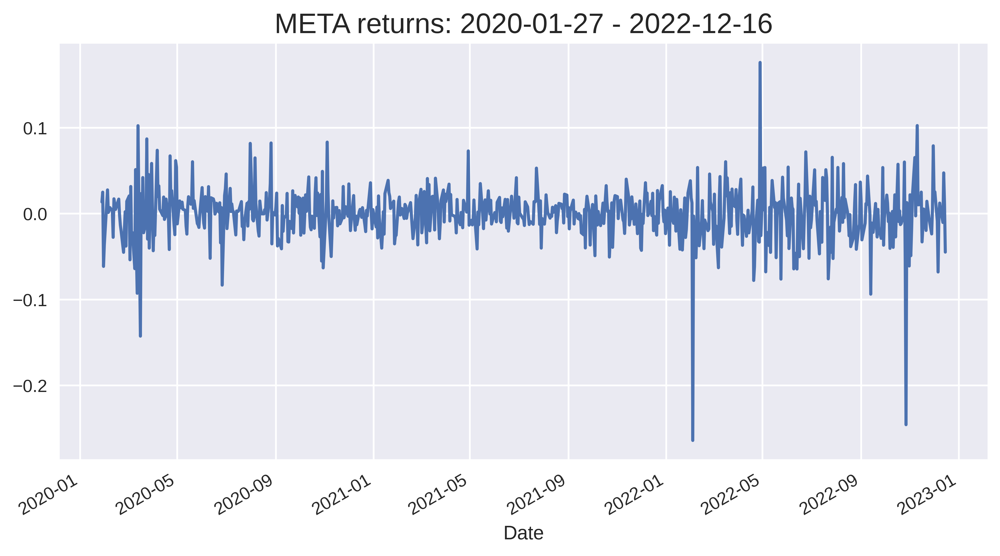

Average return: -0.03%


In [ ]:
adj_close = df['Adj Close']
returns = adj_close.pct_change().dropna()

ax = returns.plot()
ax.set_title(f'{RISKY_ASSET} returns: {START_DATE} - {END_DATE}', 
             fontsize=16)

plt.tight_layout()
plt.show()

print(f'Average return: {100 * returns.mean():.2f}%')

In [ ]:
train = returns['2020-01-27':'2022-10-31']
test = returns['2022-11-01':'2022-12-16']

In [ ]:
T = len(test)
N = len(test)
s_0 = adj_close[train.index[-1]]
N_SIM = 100
mu = train.mean()
sigma = train.std()

In [ ]:
def simulate_gbm(s_0, mu, sigma, n_sims, T, N, 
                random_seed=42):
    '''
    Function used for simulating stock returns using Geometric Brownian Motion.
    
    Parameters
    ------------
    s_0 : float
    Initial stock price
    mu : float
    Drift coefficient
    sigma : float
    Diffusion coefficient
    n_sims : int
    Number of simulations paths
    dt : float
    Time increment, most commonly a day
    T : float
    Length of the forecast horizon, same unit as dt
    N : int
    Number of time increments in the forecast horizon
    random_seed : int
    Random seed for reproducibility
    
    Returns
    -----------
    S_t : np.ndarray
    Matrix (size: n_sims x (T+1)) containing the simulation results. 
    Rows respresent sample paths, while columns point of time.
    '''''
    np.random.seed(random_seed)
    
    dt = T/N
    dW = np.random.normal(scale = np.sqrt(dt), size=(n_sims, N))
    W = np.cumsum(dW, axis=1)
    
    time_step = np.linspace(dt, T, N)
    time_steps = np.broadcast_to(time_step, (n_sims, N))
    
    S_t = s_0 * np.exp((mu - 0.5 * sigma**2) * time_steps 
                      + sigma * W)
    S_t = np.insert(S_t, 0, s_0, axis=1)
    
    return S_t

In [ ]:
gbm_simulations = simulate_gbm(s_0, mu, sigma, N_SIM, T, N)

In [ ]:

# prepare objects for plotting 
last_train_date = train.index[-1].date()
first_test_date = test.index[0].date()
last_test_date = test.index[-1].date()
plot_title = (f'{RISKY_ASSET} Simulation '
              f'({first_test_date}:{last_test_date})')

selected_indices = adj_close[last_train_date:last_test_date].index
index = [date.date() for date in selected_indices]

gbm_simulations_df = pd.DataFrame(np.transpose(gbm_simulations), 
                                 index=index)

# plotting
ax = gbm_simulations_df.plot(alpha=0.2, legend=False)
line_1, = ax.plot(index, gbm_simulations_df.mean(axis=1), 
                 color='red')
line_2, = ax.plot(index, adj_close[last_train_date:last_test_date], 
                 color='blue')
ax.set_title(plot_title, fontsize=16)
ax.legend((line_1, line_2), ('mean', 'actual'))

plt.tight_layout()
plt.show()

Output hidden; open in https://colab.research.google.com to view.

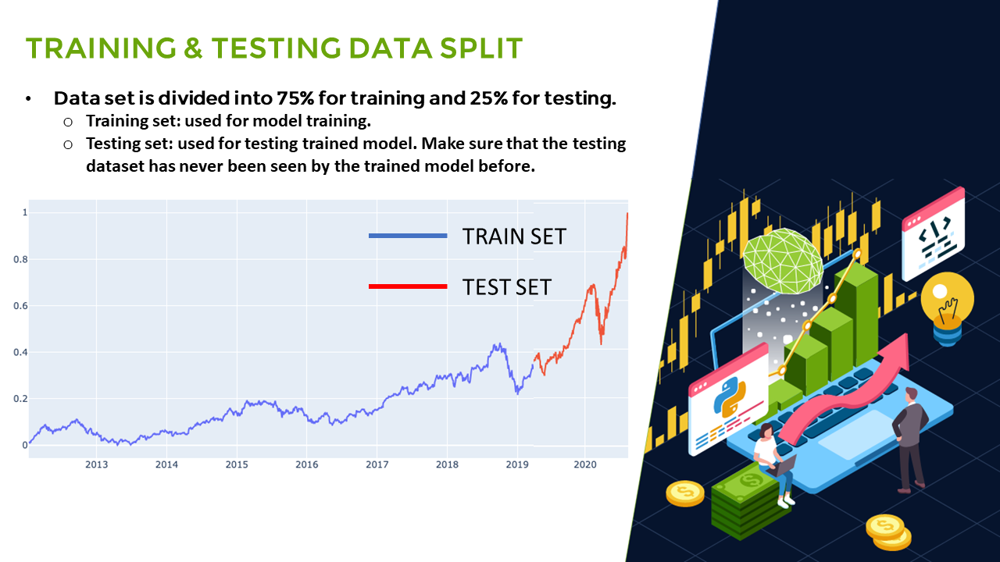

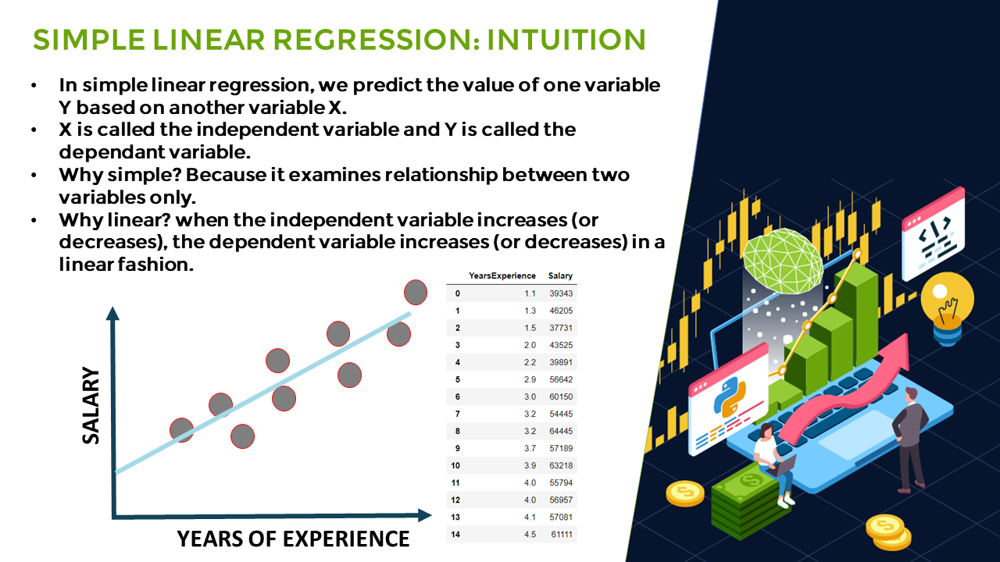

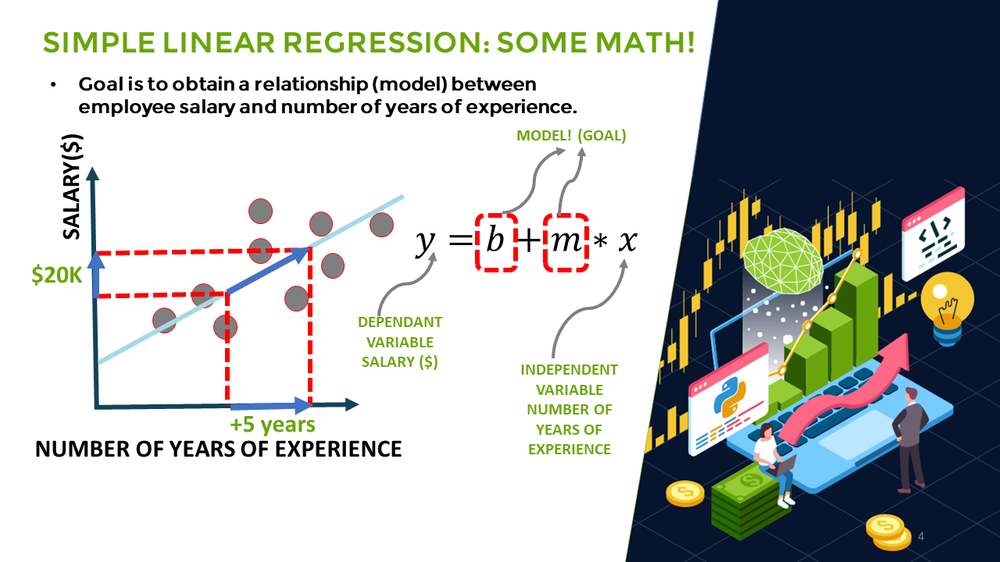

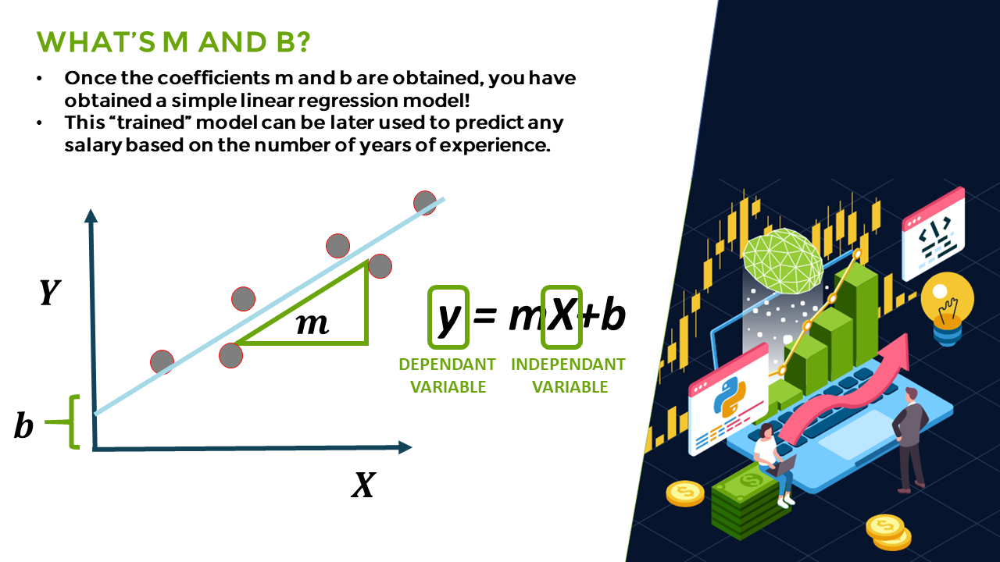

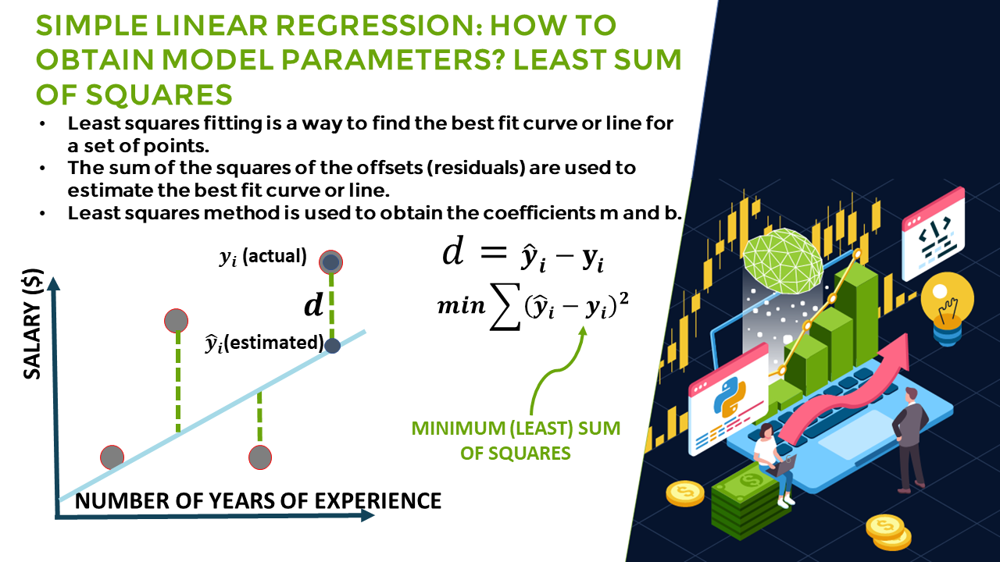

...

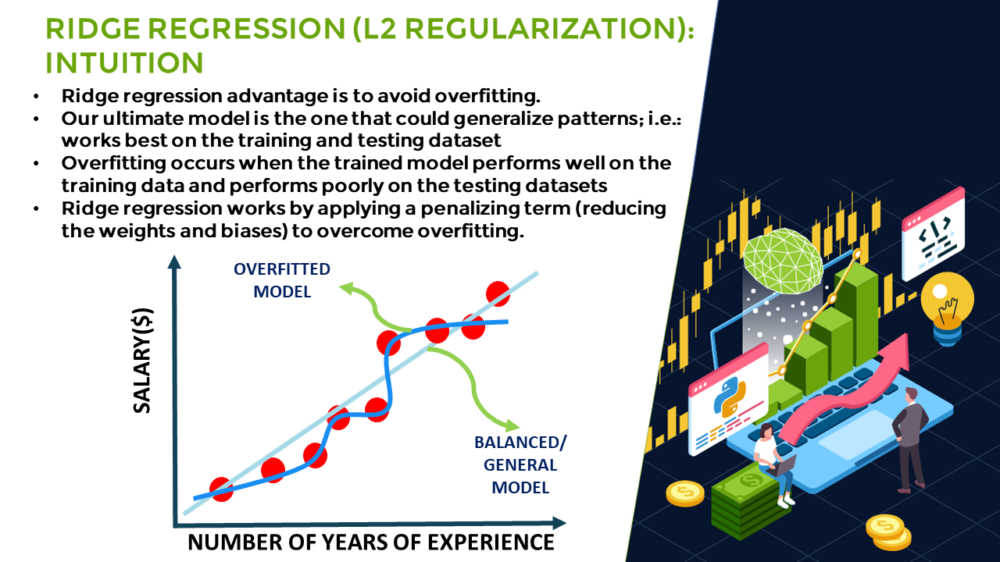

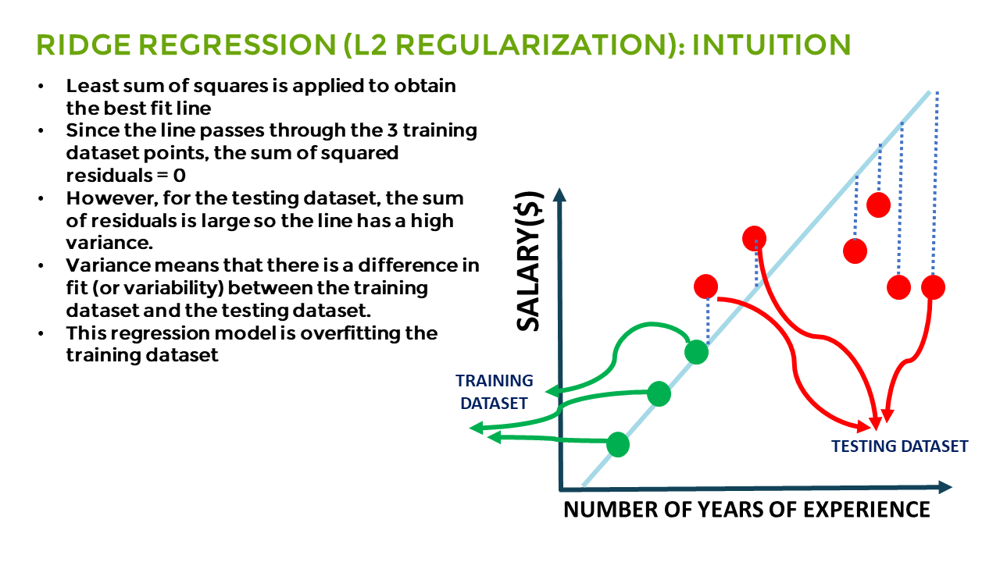

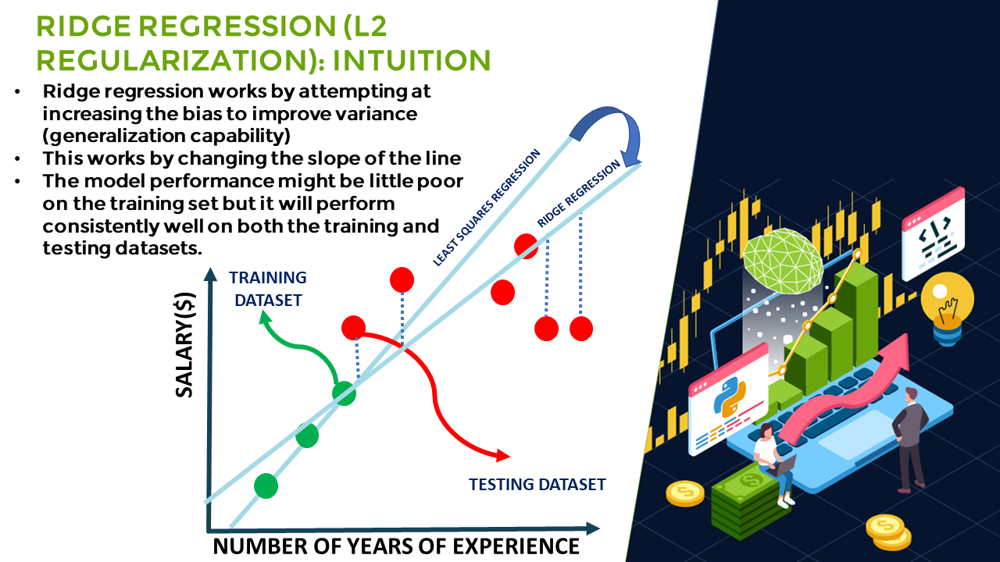

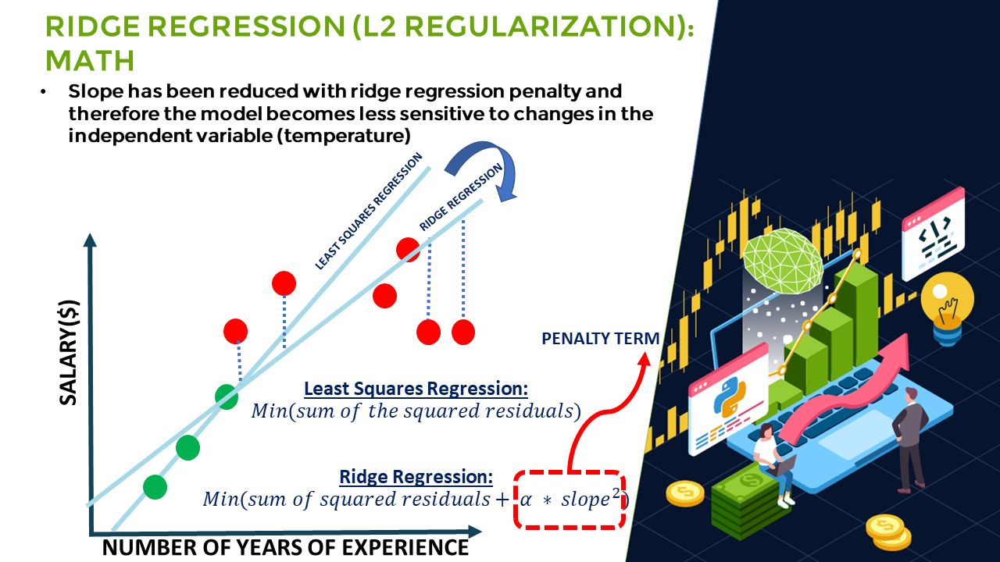

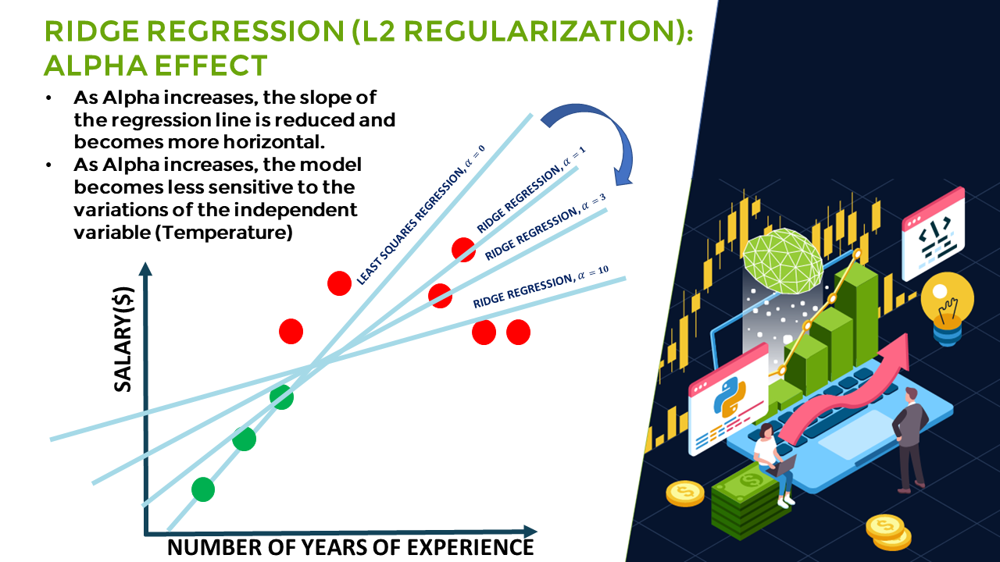

predictions


BUILD AND TRAIN A RIDGE LINEAR REGRESSION MODEL

In [ ]:
import pandas as pd
import plotly.express as px
from copy import copy
from scipy import stats
import matplotlib.pyplot as plt
import numpy as np
import plotly.figure_factory as ff
from sklearn.linear_model import LinearRegression
from sklearn.svm import SVR
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score
from tensorflow import keras

In [ ]:
def trading_window(data):
  
  # 1 day window 
  n = 1

  # Create a column containing the prices for the next 1 days
  data['Target'] = data[['Close']].shift(-n)
  
  # return the new dataset 
  return data

In [ ]:
data = pd.read_csv("/content/META.csv")

In [ ]:
data

,Date,Open,High,Low,Close,Adj Close,Volume
0,2020-01-27,213.100006,216.059998,212.500000,214.869995,214.869995,13810700
1,2020-01-28,216.139999,218.740005,213.520004,217.789993,217.789993,13413800
2,2020-01-29,221.440002,224.199997,218.449997,223.229996,223.229996,33181300
3,2020-01-30,206.529999,211.429993,204.750000,209.529999,209.529999,48775500
4,2020-01-31,208.429993,208.690002,201.059998,201.910004,201.910004,31359900
...,...,...,...,...,...,...,...
725,2022-12-09,115.300003,117.540001,113.870003,115.900002,115.900002,26033400
726,2022-12-12,115.180000,115.720001,113.139999,114.709999,114.709999,24747100
727,2022-12-13,122.129997,123.300003,118.639999,120.150002,120.150002,44701100
728,2022-12-14,119.389999,124.139999,119.389999,121.589996,121.589996,36922000


In [ ]:
data = data[["Date","Close","Volume"]]


In [ ]:
data

,Date,Close,Volume
0,2020-01-27,214.869995,13810700
1,2020-01-28,217.789993,13413800
2,2020-01-29,223.229996,33181300
3,2020-01-30,209.529999,48775500
4,2020-01-31,201.910004,31359900
...,...,...,...
725,2022-12-09,115.900002,26033400
726,2022-12-12,114.709999,24747100
727,2022-12-13,120.150002,44701100
728,2022-12-14,121.589996,36922000


In [ ]:
price_volume_target_df = trading_window(data)
price_volume_target_df

,Date,Close,Volume,Target
0,2020-01-27,214.869995,13810700,217.789993
1,2020-01-28,217.789993,13413800,223.229996
2,2020-01-29,223.229996,33181300,209.529999
3,2020-01-30,209.529999,48775500,201.910004
4,2020-01-31,201.910004,31359900,204.190002
...,...,...,...,...
725,2022-12-09,115.900002,26033400,114.709999
726,2022-12-12,114.709999,24747100,120.150002
727,2022-12-13,120.150002,44701100,121.589996
728,2022-12-14,121.589996,36922000,116.150002


In [ ]:
# Remove the last row as it will be a null value
price_volume_target_df = price_volume_target_df[:-1]
price_volume_target_df

,Date,Close,Volume,Target
0,2020-01-27,214.869995,13810700,217.789993
1,2020-01-28,217.789993,13413800,223.229996
2,2020-01-29,223.229996,33181300,209.529999
3,2020-01-30,209.529999,48775500,201.910004
4,2020-01-31,201.910004,31359900,204.190002
...,...,...,...,...
724,2022-12-08,115.330002,30619400,115.900002
725,2022-12-09,115.900002,26033400,114.709999
726,2022-12-12,114.709999,24747100,120.150002
727,2022-12-13,120.150002,44701100,121.589996


In [ ]:
# Scale the data
from sklearn.preprocessing import MinMaxScaler
sc = MinMaxScaler(feature_range = (0, 1))
price_volume_target_scaled_df = sc.fit_transform(price_volume_target_df.drop(columns = ['Date']))

In [ ]:
price_volume_target_scaled_df

array([[0.42950181, 0.03150816, 0.4394585 ],
       [0.4394585 , 0.02974896, 0.45800797],
       [0.45800797, 0.11736519, 0.41129335],
       ...,
       [0.08797353, 0.07998197, 0.106523  ],
       [0.106523  , 0.16842483, 0.11143313],
       [0.11143313, 0.13394523, 0.09288369]])

In [ ]:
price_volume_target_scaled_df.shape

(729, 3)

In [ ]:
# Creating Feature and Target
X = price_volume_target_scaled_df[:,:2]
y = price_volume_target_scaled_df[:,2:]

In [ ]:
# Converting dataframe to arrays
# X = np.asarray(X)
# y = np.asarray(y)
X.shape, y.shape

((729, 2), (729, 1))

In [ ]:
# Spliting the data this way, since order is important in time-series
# Note that we did not use train test split with it's default settings since it shuffles the data
split = int(0.65 * len(X))
X_train = X[:split]
y_train = y[:split]
X_test = X[split:]
y_test = y[split:]

In [ ]:
X_train.shape, y_train.shape

((473, 2), (473, 1))

In [ ]:
X_test.shape, y_test.shape

((256, 2), (256, 1))

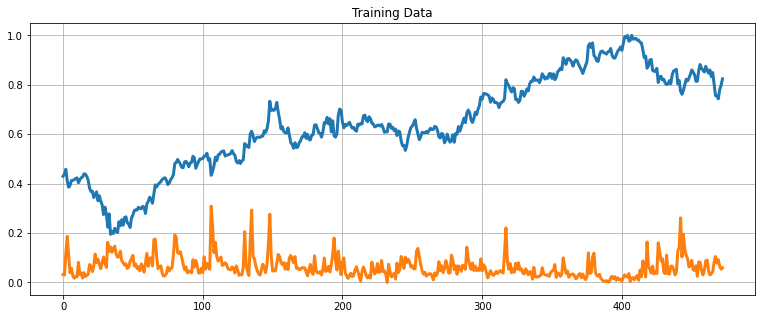

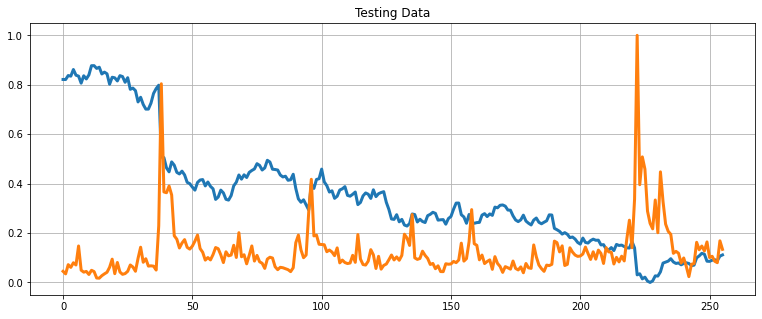

In [ ]:
# Define a data plotting function
def show_plot(data, title):
  plt.figure(figsize = (13, 5))
  plt.plot(data, linewidth = 3)
  plt.title(title)
  plt.grid()

show_plot(X_train, 'Training Data')
show_plot(X_test, 'Testing Data')

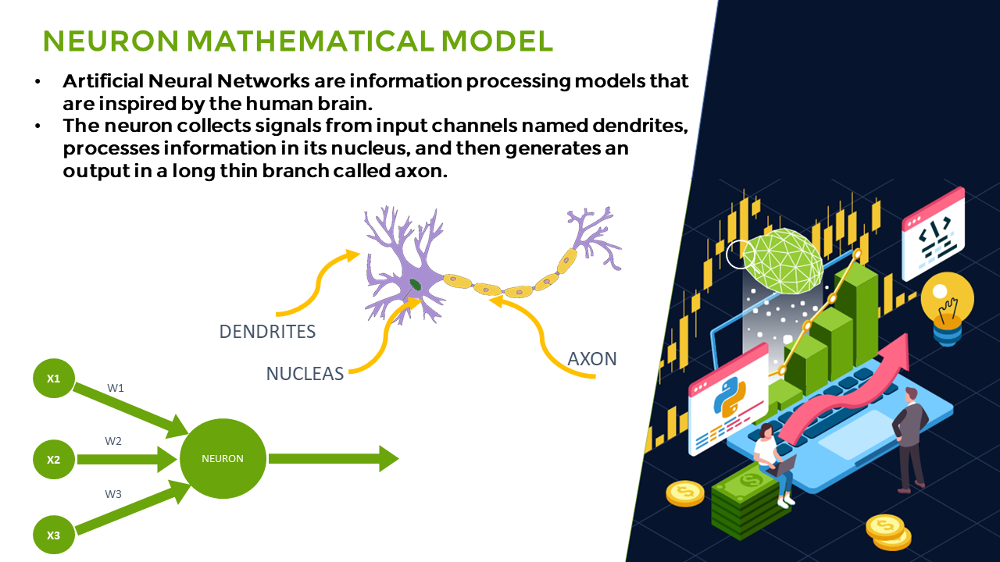

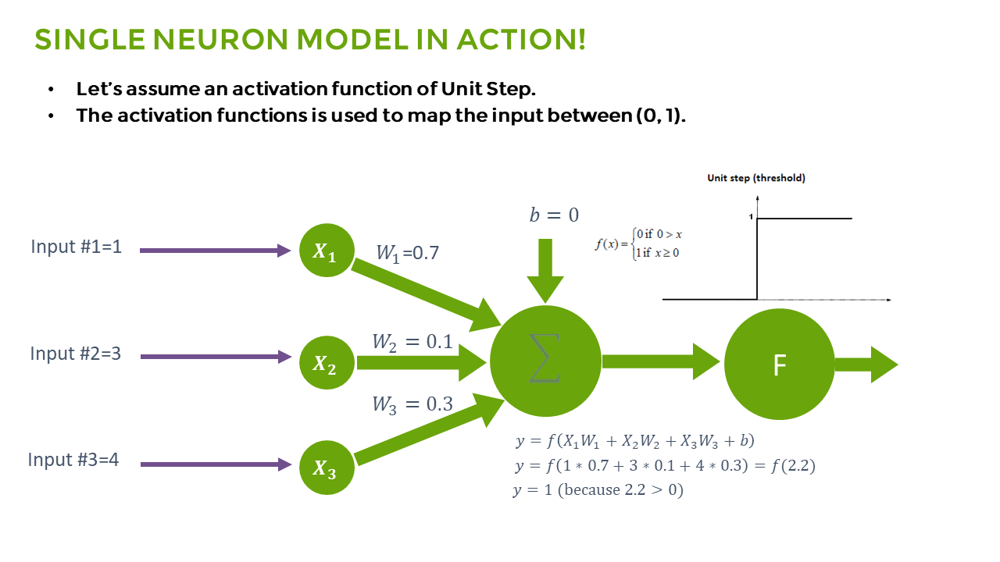

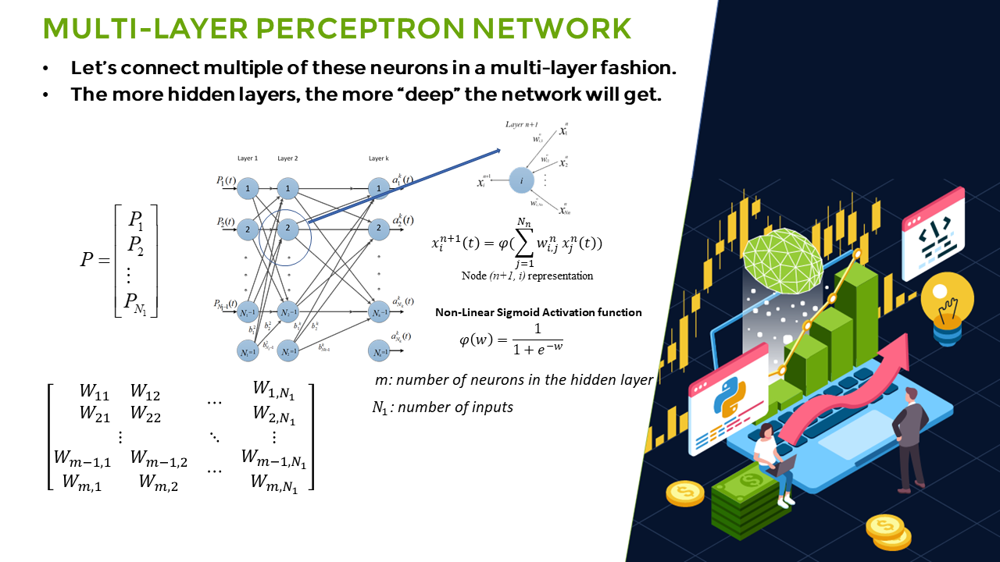

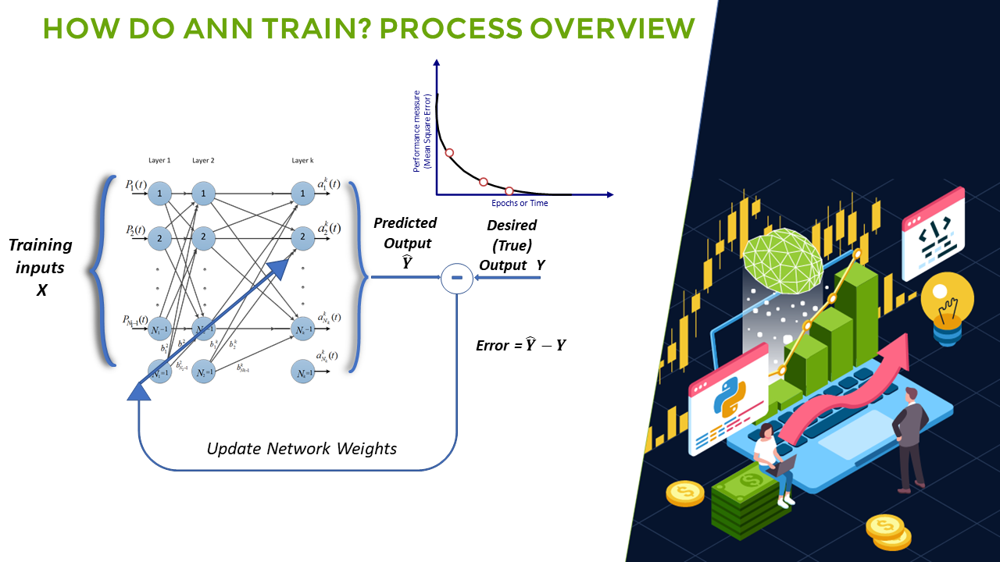

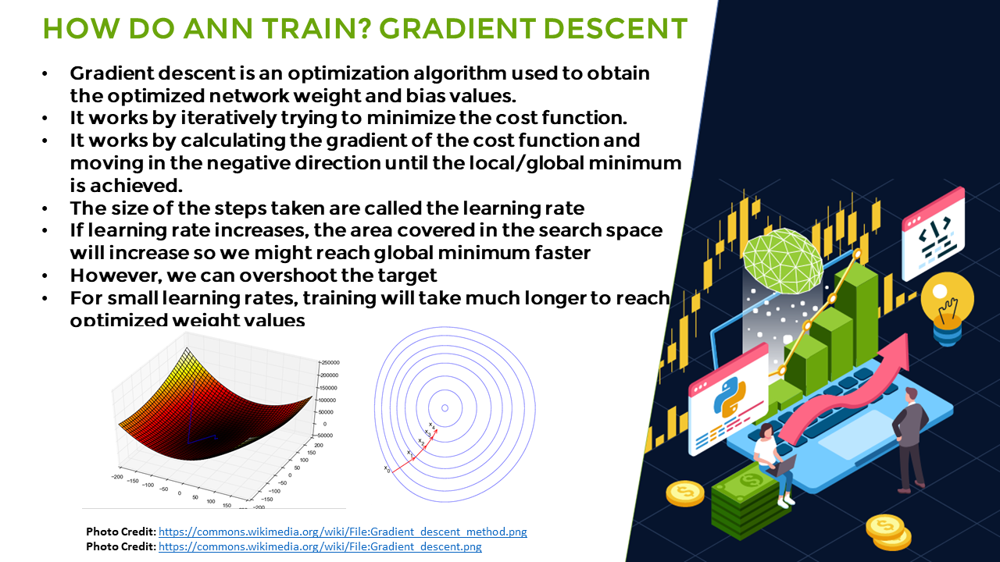

...

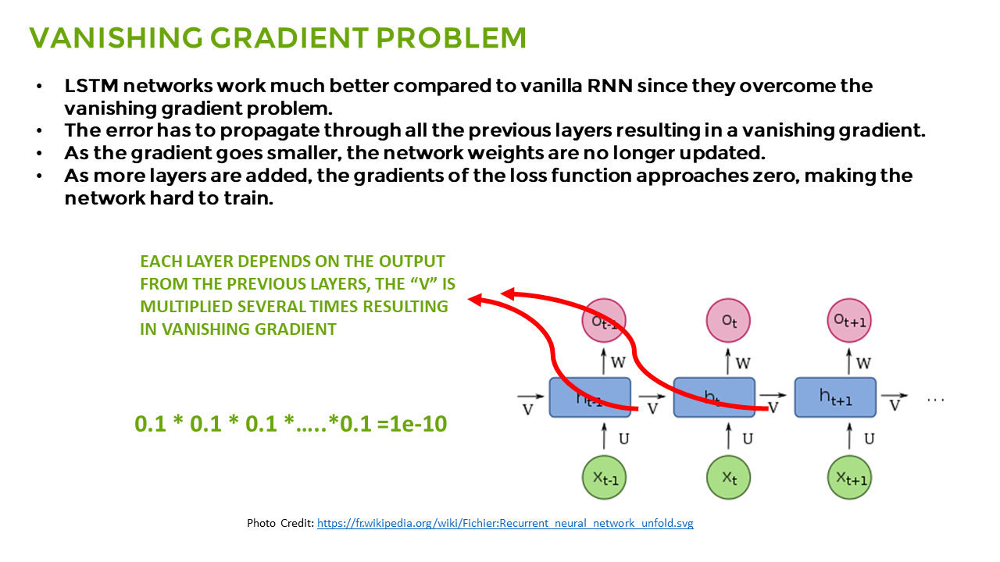

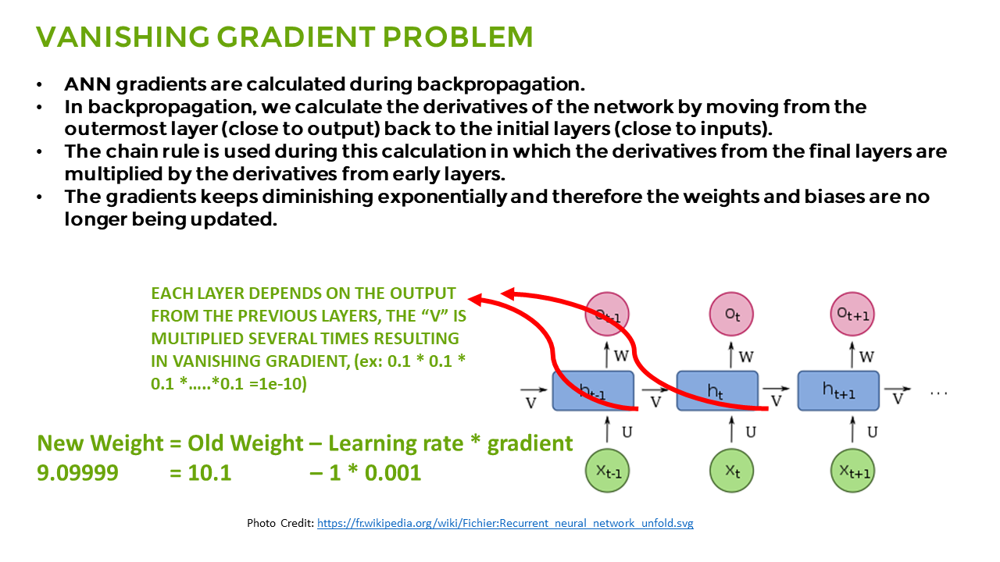

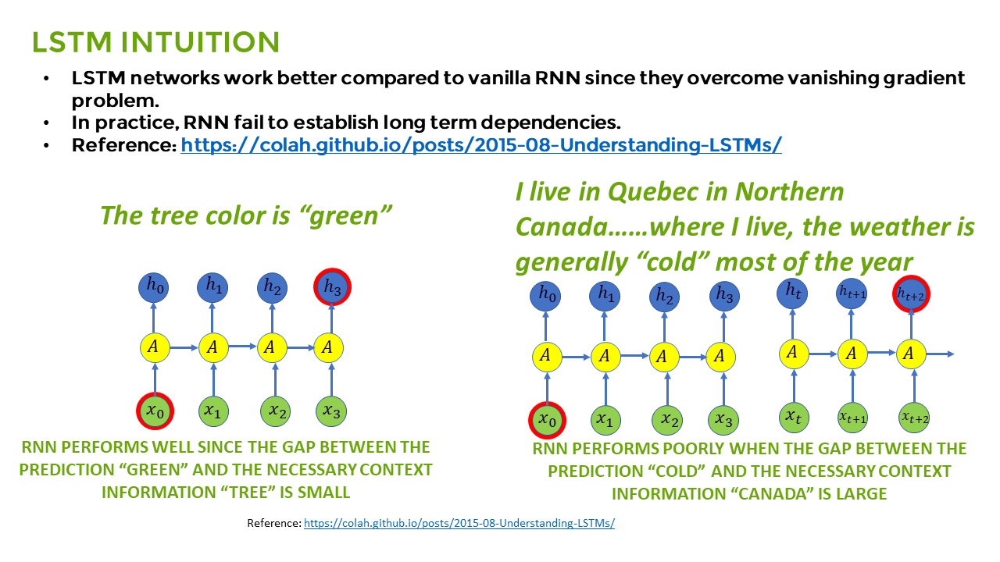

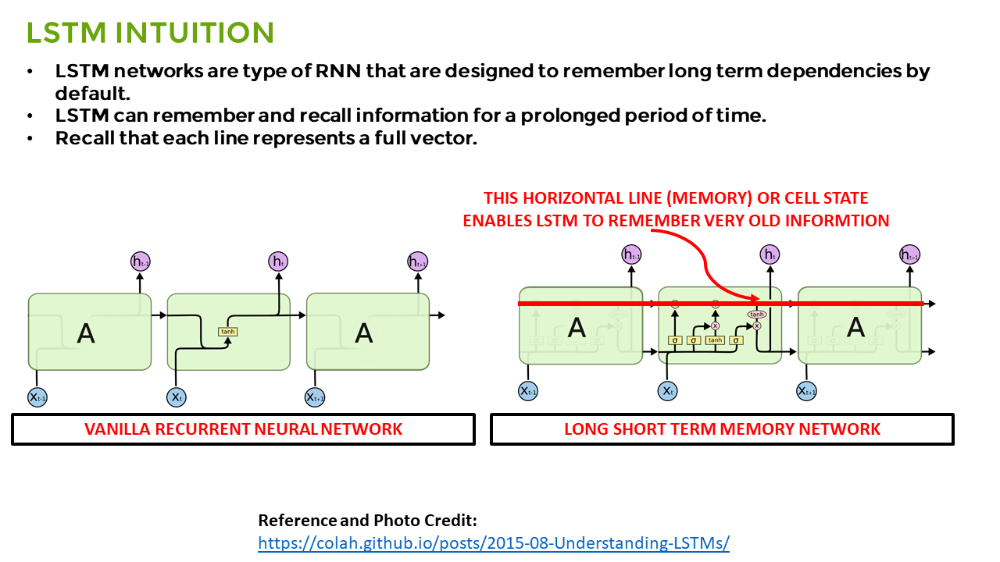

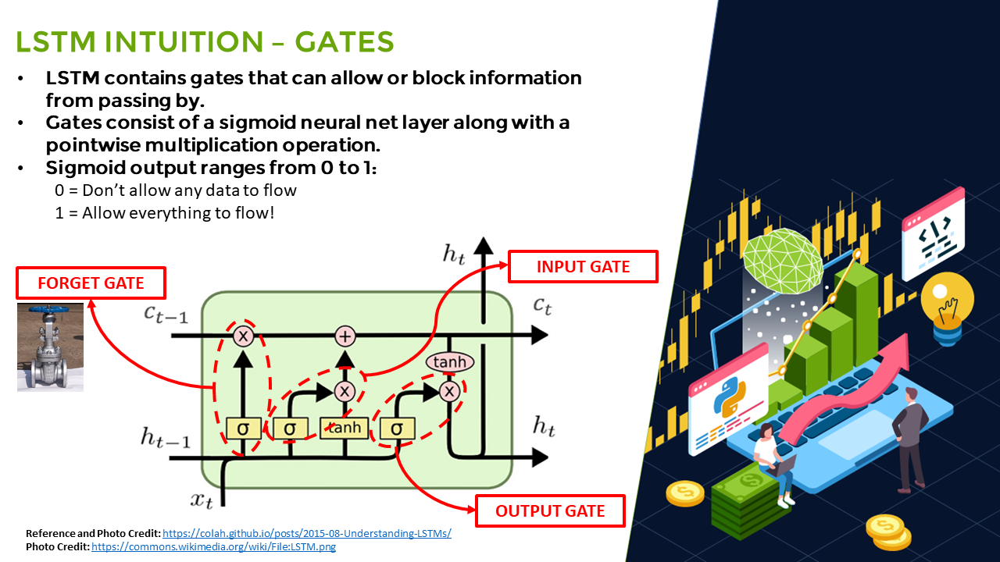

BUILD AND TRAIN A RIDGE LINEAR REGRESSION MODEL

In [ ]:
from sklearn.linear_model import Ridge
# Note that Ridge regression performs linear least squares with L2 regularization.
# Create and train the Ridge Linear Regression  Model
regression_model = Ridge()
regression_model.fit(X_train, y_train)

Ridge()

In [ ]:
# Test the model and calculate its accuracy 
lr_accuracy = regression_model.score(X_test, y_test)
print("Linear Regression Score: ", lr_accuracy)

Linear Regression Score:  0.9747293956402524


In [ ]:
# Make Prediction
predicted_prices = regression_model.predict(X)
predicted_prices

array([[0.44493197],
       [0.45433626],
       [0.46835168],
       [0.42188183],
       [0.40049409],
       [0.41049561],
       [0.42782261],
       [0.42992978],
       [0.4326327 ],
       [0.43707858],
       [0.43947867],
       [0.41845817],
       [0.43179008],
       [0.4391294 ],
       [0.44325028],
       [0.45399304],
       [0.45359562],
       [0.44412464],
       [0.42988795],
       [0.39810428],
       [0.38575592],
       [0.3879698 ],
       [0.36326747],
       [0.37010383],
       [0.38409992],
       [0.34984843],
       [0.36945842],
       [0.34902481],
       [0.33508611],
       [0.29710694],
       [0.32582077],
       [0.30110956],
       [0.24677367],
       [0.29873275],
       [0.2204321 ],
       [0.23216676],
       [0.22373755],
       [0.24307093],
       [0.23344632],
       [0.22870245],
       [0.26978096],
       [0.25371852],
       [0.27799062],
       [0.25733414],
       [0.28702664],
       [0.28954602],
       [0.26723712],
       [0.262

In [ ]:
# Append the predicted values into a list
Predicted = []
for i in predicted_prices:
  Predicted.append(i[0])

In [ ]:
len(Predicted)

729

In [ ]:
# Append the close values to the list
close = []
for i in price_volume_target_scaled_df:
  close.append(i[0])

In [ ]:
# Create a dataframe based on the dates in the individual stock data
df_predicted = price_volume_target_df[['Date']]
df_predicted

,Date
0,2020-01-27
1,2020-01-28
2,2020-01-29
3,2020-01-30
4,2020-01-31
...,...
724,2022-12-08
725,2022-12-09
726,2022-12-12
727,2022-12-13


In [ ]:
# Add the close values to the dataframe
df_predicted['Close'] = close
df_predicted

,Date,Close
0,2020-01-27,0.429502
1,2020-01-28,0.439458
2,2020-01-29,0.458008
3,2020-01-30,0.411293
4,2020-01-31,0.385310
...,...,...
724,2022-12-08,0.090088
725,2022-12-09,0.092031
726,2022-12-12,0.087974
727,2022-12-13,0.106523


In [ ]:
# Add the predicted values to the dataframe
df_predicted['Prediction'] = Predicted
df_predicted

,Date,Close,Prediction
0,2020-01-27,0.429502,0.444932
1,2020-01-28,0.439458,0.454336
2,2020-01-29,0.458008,0.468352
3,2020-01-30,0.411293,0.421882
4,2020-01-31,0.385310,0.400494
...,...,...,...
724,2022-12-08,0.090088,0.123788
725,2022-12-09,0.092031,0.126395
726,2022-12-12,0.087974,0.122810
727,2022-12-13,0.106523,0.136793


In [ ]:
# Function to plot interactive plots using Plotly Express
def interactive_plot(df, title):
  fig = px.line(title = title)
  for i in df.columns[1:]:
    fig.add_scatter(x = df['Date'], y = df[i], name = i)
  fig.show()

In [ ]:
# Plot the results
interactive_plot(df_predicted, "Original Vs. Prediction")

TRAIN AN LSTM TIME SERIES MODEL

In [ ]:
data

,Date,Close,Volume
0,2020-01-27,214.869995,13810700
1,2020-01-28,217.789993,13413800
2,2020-01-29,223.229996,33181300
3,2020-01-30,209.529999,48775500
4,2020-01-31,201.910004,31359900
...,...,...,...
725,2022-12-09,115.900002,26033400
726,2022-12-12,114.709999,24747100
727,2022-12-13,120.150002,44701100
728,2022-12-14,121.589996,36922000


In [ ]:
price_volume_df = data
price_volume_df

,Date,Close,Volume
0,2020-01-27,214.869995,13810700
1,2020-01-28,217.789993,13413800
2,2020-01-29,223.229996,33181300
3,2020-01-30,209.529999,48775500
4,2020-01-31,201.910004,31359900
...,...,...,...
725,2022-12-09,115.900002,26033400
726,2022-12-12,114.709999,24747100
727,2022-12-13,120.150002,44701100
728,2022-12-14,121.589996,36922000


In [ ]:
# Get the close and volume data as training data (Input)
training_data = price_volume_df.iloc[:, 1:3].values
training_data

array([[2.14869995e+02, 1.38107000e+07],
       [2.17789993e+02, 1.34138000e+07],
       [2.23229996e+02, 3.31813000e+07],
       ...,
       [1.20150002e+02, 4.47011000e+07],
       [1.21589996e+02, 3.69220000e+07],
       [1.16150002e+02, 3.45310000e+07]])

In [ ]:
# Normalize the data
from sklearn.preprocessing import MinMaxScaler
sc = MinMaxScaler(feature_range = (0, 1))
training_set_scaled = sc.fit_transform(training_data)

In [ ]:
# Create the training and testing data, training data contains present day and previous day values
X = []
y = []
for i in range(1, len(price_volume_df)):
    X.append(training_set_scaled [i-1:i, 0])
    y.append(training_set_scaled [i, 0])

In [ ]:
X

[array([0.42950181]),
 array([0.4394585]),
 array([0.45800797]),
 array([0.41129335]),
 array([0.38531048]),
 array([0.39308488]),
 array([0.4123163]),
 array([0.41327105]),
 array([0.41579434]),
 array([0.42084087]),
 array([0.42333003]),
 array([0.40331436]),
 array([0.41548742]),
 array([0.42360282]),
 array([0.42714902]),
 array([0.43949263]),
 array([0.43843559]),
 array([0.42851298]),
 array([0.41350971]),
 array([0.38125277]),
 array([0.36778397]),
 array([0.36925017]),
 array([0.34384697]),
 array([0.3531217]),
 array([0.36665872]),
 array([0.33068503]),
 array([0.3507007]),
 array([0.32822995]),
 array([0.31431785]),
 array([0.27479796]),
 array([0.30442937]),
 array([0.27732125]),
 array([0.22354826]),
 array([0.27745763]),
 array([0.19470111]),
 array([0.20632863]),
 array([0.19794048]),
 array([0.21897911]),
 array([0.20738567]),
 array([0.20182768]),
 array([0.24574622]),
 array([0.22948138]),
 array([0.25379341]),
 array([0.23145904]),
 array([0.26269307]),
 array([0.2655

In [ ]:
# Convert the data into array format
X = np.asarray(X)
y = np.asarray(y)

In [ ]:
# Split the data
split = int(0.7 * len(X))
X_train = X[:split]
y_train = y[:split]
X_test = X[split:]
y_test = y[split:]

In [ ]:
# Reshape the 1D arrays to 3D arrays to feed in the model
X_train = np.reshape(X_train, (X_train.shape[0], X_train.shape[1], 1))
X_test = np.reshape(X_test, (X_test.shape[0], X_test.shape[1], 1))
X_train.shape, X_test.shape

((510, 1, 1), (219, 1, 1))

In [ ]:
# Create the model
inputs = keras.layers.Input(shape=(X_train.shape[1], X_train.shape[2]))
x = keras.layers.LSTM(150, return_sequences= True)(inputs)
x = keras.layers.Dropout(0.3)(x)
x = keras.layers.LSTM(150, return_sequences=True)(x)
x = keras.layers.Dropout(0.3)(x)
x = keras.layers.LSTM(150)(x)
outputs = keras.layers.Dense(1, activation='linear')(x)

model = keras.Model(inputs=inputs, outputs=outputs)
model.compile(optimizer='adam', loss="mse")
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 1, 1)]            0         
                                                                 
 lstm (LSTM)                 (None, 1, 150)            91200     
                                                                 
 dropout (Dropout)           (None, 1, 150)            0         
                                                                 
 lstm_1 (LSTM)               (None, 1, 150)            180600    
                                                                 
 dropout_1 (Dropout)         (None, 1, 150)            0         
                                                                 
 lstm_2 (LSTM)               (None, 150)               180600    
                                                                 
 dense (Dense)               (None, 1)                 151   

In [ ]:
# Trai the model
history = model.fit(
    X_train, y_train,
    epochs = 20,
    batch_size = 32,
    validation_split = 0.2
)

Epoch 1/20
13/13 [==============================] - 7s 118ms/step - loss: 0.3470 - val_loss: 0.4499
Epoch 2/20
13/13 [==============================] - 0s 13ms/step - loss: 0.1192 - val_loss: 0.0041
Epoch 3/20
13/13 [==============================] - 0s 13ms/step - loss: 0.0285 - val_loss: 0.0246
Epoch 4/20
13/13 [==============================] - 0s 13ms/step - loss: 0.0178 - val_loss: 0.0226
Epoch 5/20
13/13 [==============================] - 0s 13ms/step - loss: 0.0145 - val_loss: 0.0086
Epoch 6/20
13/13 [==============================] - 0s 13ms/step - loss: 0.0121 - val_loss: 0.0116
Epoch 7/20
13/13 [==============================] - 0s 13ms/step - loss: 0.0102 - val_loss: 0.0076
Epoch 8/20
13/13 [==============================] - 0s 13ms/step - loss: 0.0084 - val_loss: 0.0060
Epoch 9/20
13/13 [==============================] - 0s 13ms/step - loss: 0.0069 - val_loss: 0.0061
Epoch 10/20
13/13 [==============================] - 0s 13ms/step - loss: 0.0058 - val_loss: 0.0018
Epoch 11

In [ ]:
# Make prediction
predicted = model.predict(X)

23/23 [==============================] - 3s 6ms/step


In [ ]:
# Append the predicted values to the list
test_predicted = []

for i in predicted:
  test_predicted.append(i[0])

In [ ]:
test_predicted

[0.43139258,
 0.44026652,
 0.45691106,
 0.41527307,
 0.39251333,
 0.3992935,
 0.41617492,
 0.41701716,
 0.41924465,
 0.42370784,
 0.42591316,
 0.4082536,
 0.41897357,
 0.42615503,
 0.42930186,
 0.440297,
 0.43935287,
 0.43051362,
 0.4172277,
 0.38898462,
 0.37732112,
 0.3785872,
 0.3567798,
 0.36471048,
 0.37635016,
 0.34558654,
 0.36263683,
 0.34350672,
 0.3317678,
 0.29885632,
 0.3234726,
 0.30093855,
 0.25712627,
 0.3010511,
 0.23410416,
 0.24334358,
 0.23667276,
 0.25345743,
 0.2441862,
 0.23976061,
 0.27507004,
 0.26190278,
 0.28162432,
 0.2634981,
 0.2889036,
 0.29128116,
 0.27124968,
 0.26735544,
 0.2563315,
 0.2877859,
 0.29697332,
 0.31235215,
 0.31493372,
 0.3137984,
 0.3234155,
 0.3199949,
 0.31794587,
 0.3264714,
 0.3236153,
 0.30251595,
 0.33518335,
 0.34339127,
 0.357711,
 0.35024652,
 0.3369944,
 0.369744,
 0.40084347,
 0.39358217,
 0.4024842,
 0.40789434,
 0.41208994,
 0.42048,
 0.42376816,
 0.42627597,
 0.41698706,
 0.4020068,
 0.40711623,
 0.41933504,
 0.42630622,
 0.

In [ ]:
df_predicted = price_volume_df[1:][['Date']]
df_predicted

,Date
1,2020-01-28
2,2020-01-29
3,2020-01-30
4,2020-01-31
5,2020-02-03
...,...
725,2022-12-09
726,2022-12-12
727,2022-12-13
728,2022-12-14


In [ ]:
df_predicted['predictions'] = test_predicted

In [ ]:
df_predicted

,Date,predictions
1,2020-01-28,0.431393
2,2020-01-29,0.440267
3,2020-01-30,0.456911
4,2020-01-31,0.415273
5,2020-02-03,0.392513
...,...,...
725,2022-12-09,0.153385
726,2022-12-12,0.154846
727,2022-12-13,0.151798
728,2022-12-14,0.165783


In [ ]:
# Plot the data
close = []
for i in training_set_scaled:
  close.append(i[0])


In [ ]:
df_predicted['Close'] = close[1:]

In [ ]:
df_predicted

,Date,predictions,Close
1,2020-01-28,0.431393,0.439458
2,2020-01-29,0.440267,0.458008
3,2020-01-30,0.456911,0.411293
4,2020-01-31,0.415273,0.385310
5,2020-02-03,0.392513,0.393085
...,...,...,...
725,2022-12-09,0.153385,0.092031
726,2022-12-12,0.154846,0.087974
727,2022-12-13,0.151798,0.106523
728,2022-12-14,0.165783,0.111433


In [ ]:
# Plot the data
interactive_plot(df_predicted, "Original Vs LSTM Prediction")